# Getting Dataset

## Importing Libraries

The necessary libraries are imported, including `yfinance` for accessing financial market data, `pandas` for data manipulation, and `datetime` for handling date and time operations.

Warnings are suppressed to maintain a clean output, ensuring that the focus remains on the analysis rather than on potential non-critical warnings.


In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import dash
from dash import Dash, dcc, html
from dash.dependencies import Input, Output
import dash_bootstrap_components as dbc

In [4]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.metrics import classification_report, accuracy_score,mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler

In [5]:
import plotly.graph_objects as go
import plotly.figure_factory as ff

In [6]:
import panel as pn

In [7]:
import scipy.stats as stats
import statsmodels.api as sm

In [8]:
import itertools

In [9]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox

In [10]:
from IPython.display import display, clear_output
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import ipywidgets as widgets

## Data Retrieval

The hourly stock data for Tesla (TSLA), NIO, BYD (using BYDDY and BYDDF), and Rivian (RIVN) over the last 730 days was retrieved using the yfinance library. BYDDY was selected for BYD because it is an American Depository Receipt (ADR) that is more actively traded in the U.S. market, providing a more accurate reflection of BYD's performance compared to BYDDF. For Rivian, only 699 days of data were available due to its recent IPO, which limits the length of its trading history. Despite this limitation, the available data was incorporated into the analysis. Each dataset was saved as a CSV file for consistency and later combined into a single DataFrame, with an additional column indicating the stock symbol, enabling a unified analysis across all stocks. The combined dataset was then saved for further analysis in subsequent steps of the project.

In [11]:
# Get the latest hourly data for TSLA for the last 730 days using yfinance
df_TSLA= yf.Ticker("TSLA").history(period="730d", interval="1h")

# Save data to a CSV file
df_TSLA.to_csv('TSLA_hourly_data.csv')
print(f"Number of rows in the df_TSLA DataFrame: {df_TSLA.shape[0]}\n")
df_TSLA.head()

Number of rows in the df_TSLA DataFrame: 5090



,Open,High,Low,Close,Volume,Dividends,Stock Splits
Datetime,,,,,,,
2021-10-26 09:30:00-04:00,343.323334,362.303345,340.566681,360.220673,19025263,0.0,0.0
2021-10-26 10:30:00-04:00,360.273315,364.979980,344.676666,349.193329,13109433,0.0,0.0
2021-10-26 11:30:00-04:00,349.168335,349.949982,342.733307,344.930023,8081349,0.0,0.0
2021-10-26 12:30:00-04:00,344.943329,346.323273,333.813324,337.010040,9023216,0.0,0.0
2021-10-26 13:30:00-04:00,337.086670,344.783325,336.333344,344.407349,4441766,0.0,0.0


In [12]:
# Get the latest hourly data for NIO for the last 730 days using yfinance
df_NIO= yf.Ticker("NIO").history(period="730d", interval="1h")

# Save data to a CSV file
df_NIO.to_csv('NIO_hourly_data.csv')

print(f"Number of rows in the df_NIO DataFrame: {df_NIO.shape[0]}\n")
df_NIO.head()

Number of rows in the df_NIO DataFrame: 5090



,Open,High,Low,Close,Volume,Dividends,Stock Splits
Datetime,,,,,,,
2021-10-26 09:30:00-04:00,41.290001,42.610001,41.070000,42.360001,18400293,0.0,0.0
2021-10-26 10:30:00-04:00,42.369999,42.455002,41.189999,41.419998,11787391,0.0,0.0
2021-10-26 11:30:00-04:00,41.415001,41.838699,40.860001,41.205002,8561716,0.0,0.0
2021-10-26 12:30:00-04:00,41.208599,41.279999,40.490002,40.590000,6631014,0.0,0.0
2021-10-26 13:30:00-04:00,40.584999,41.040001,40.560001,40.985001,3110409,0.0,0.0


In [13]:
# Get the latest hourly data for BYDDY for the last 730 days using yfinance
df_BYDDY= yf.Ticker("BYDDY").history(period="730d", interval="1h")

# Save data to a CSV file
df_BYDDY.to_csv('BYDDY_hourly_data.csv')

print(f"Number of rows in the df_BYDDY DataFrame: {df_BYDDY.shape[0]}\n")
df_BYDDY.head()

Number of rows in the df_BYDDY DataFrame: 5093



,Open,High,Low,Close,Volume,Dividends,Stock Splits
Datetime,,,,,,,
2021-10-26 09:30:00-04:00,80.980003,80.980003,80.099998,80.279999,0,0.0,0.0
2021-10-26 10:30:00-04:00,80.300003,80.650002,80.080002,80.080002,40757,0.0,0.0
2021-10-26 11:30:00-04:00,80.040001,80.239998,79.730003,79.830002,51962,0.0,0.0
2021-10-26 12:30:00-04:00,79.790001,79.800003,79.330002,79.459999,39773,0.0,0.0
2021-10-26 13:30:00-04:00,79.510002,79.550003,79.489998,79.510002,25365,0.0,0.0


In [14]:
# Get the latest hourly data for BYDDF for the last 730 days using yfinance
df_BYDDF= yf.Ticker("BYDDF").history(period="730d", interval="1h")

# Save data to a CSV file
df_BYDDF.to_csv('BYDDF_hourly_data.csv')

print(f"Number of rows in the df_BYDDF DataFrame: {df_BYDDF.shape[0]}\n")
df_BYDDF.head()

Number of rows in the df_BYDDF DataFrame: 4970



,Open,High,Low,Close,Volume,Dividends,Stock Splits
Datetime,,,,,,,
2021-10-26 09:30:00-04:00,39.820000,40.790001,39.820000,40.223999,0,0.0,0.0
2021-10-26 10:30:00-04:00,40.209999,40.360001,40.139999,40.180000,36608,0.0,0.0
2021-10-26 11:30:00-04:00,40.240002,40.299999,39.950001,40.034000,32131,0.0,0.0
2021-10-26 12:30:00-04:00,39.950001,40.041000,39.720001,39.845001,25114,0.0,0.0
2021-10-26 13:30:00-04:00,39.799999,39.849998,39.689999,39.790001,14357,0.0,0.0


In [15]:
# Get the latest hourly data for RIVN for the last 730 days using yfinance.But for RIVN only has the last 704 trading days.
df_RIVN= yf.Ticker("RIVN").history(period="704d", interval="1h")

# Save data to a CSV file
df_RIVN.to_csv('RIVN_hourly_data.csv')

print(f"Number of rows in the df_RIVN DataFrame: {df_RIVN.shape[0]}\n")
df_RIVN.head()

Number of rows in the df_RIVN DataFrame: 4912



,Open,High,Low,Close,Volume,Dividends,Stock Splits
Datetime,,,,,,,
2021-12-02 09:30:00-05:00,114.169998,118.449997,111.360001,112.000000,2942496,0.0,0.0
2021-12-02 10:30:00-05:00,111.849998,112.349998,108.000000,108.839996,2943229,0.0,0.0
2021-12-02 11:30:00-05:00,108.862900,111.879997,107.750000,110.813698,1780249,0.0,0.0
2021-12-02 12:30:00-05:00,110.879997,111.260002,109.010002,109.220001,761265,0.0,0.0
2021-12-02 13:30:00-05:00,109.360001,112.400002,108.989998,111.871803,766996,0.0,0.0


In [16]:
# Add a new column to each dataframe specifying the stock
df_TSLA['Stock'] = 'TSLA'
df_NIO['Stock'] = 'NIO'
df_BYDDY['Stock'] = 'BYDDY'
df_RIVN['Stock'] = 'RIVN'

In [17]:
# Combine all dataframes into one dataframe
df_combined = pd.concat([df_TSLA, df_NIO, df_BYDDY, df_RIVN])

# Save the merged dataframe to a new CSV file
#df_combined.to_csv("combined_stocks.csv", index=False)
df_combined

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Stock
Datetime,,,,,,,,
2021-10-26 09:30:00-04:00,343.323334,362.303345,340.566681,360.220673,19025263,0.0,0.0,TSLA
2021-10-26 10:30:00-04:00,360.273315,364.979980,344.676666,349.193329,13109433,0.0,0.0,TSLA
2021-10-26 11:30:00-04:00,349.168335,349.949982,342.733307,344.930023,8081349,0.0,0.0,TSLA
2021-10-26 12:30:00-04:00,344.943329,346.323273,333.813324,337.010040,9023216,0.0,0.0,TSLA
2021-10-26 13:30:00-04:00,337.086670,344.783325,336.333344,344.407349,4441766,0.0,0.0,TSLA
...,...,...,...,...,...,...,...,...
2024-09-20 11:30:00-04:00,12.155000,12.275000,12.050000,12.065000,7433586,0.0,0.0,RIVN
2024-09-20 12:30:00-04:00,12.065000,12.070000,11.850000,11.905000,9256303,0.0,0.0,RIVN
2024-09-20 13:30:00-04:00,11.905000,11.960000,11.820000,11.875000,7336789,0.0,0.0,RIVN


In [18]:
# Combine dataframes and select only 'Datetime' and 'Close' columns with the stock name
df_combined_Close = pd.concat(
    [
        df_TSLA[['Close', 'Stock']],
        df_NIO[['Close', 'Stock']],
        df_BYDDY[['Close', 'Stock']],
        df_RIVN[['Close', 'Stock']]
    ]
)

# Pivot the combined dataframe to create a multi-index structure
df_combined_Close = df_combined_Close.pivot( columns='Stock', values='Close')

# Rename the columns (remove the stock name level)
df_combined_Close.columns.name = None

# Save the combined dataframe to a new CSV file
df_combined_Close.to_csv("combined_stocks_close_6.csv", index=True, index_label='Datetime')
df_combined_Close

,BYDDY,NIO,RIVN,TSLA
Datetime,,,,
2021-10-26 09:30:00-04:00,80.279999,42.360001,NaN,360.220673
2021-10-26 10:30:00-04:00,80.080002,41.419998,NaN,349.193329
2021-10-26 11:30:00-04:00,79.830002,41.205002,NaN,344.930023
2021-10-26 12:30:00-04:00,79.459999,40.590000,NaN,337.010040
2021-10-26 13:30:00-04:00,79.510002,40.985001,NaN,344.407349
...,...,...,...,...
2024-09-20 11:30:00-04:00,62.619999,5.270500,12.0650,238.940002
2024-09-20 12:30:00-04:00,62.580002,5.220100,11.9050,238.210007
2024-09-20 13:30:00-04:00,62.570000,5.256200,11.8750,237.792694


## Data Preparation

In this step, the previously saved dataset (combined_stocks_close_4.csv) is loaded to maintain consistency in the analysis. The Datetime column is converted to a datetime format to ensure proper chronological ordering and manipulation. The Datetime column is then set as the index, allowing for easier sorting and filtering based on time. This step ensures that the data is organized in a time-series format, facilitating further analysis, especially for time-dependent metrics and calculations.

In [19]:
# I load the data from a previously saved CSV file to use the same dataset during the analysis.
df = pd.read_csv("combined_stocks_close.csv")

# Convert the 'Datetime' column to datetime format
df['Datetime'] = pd.to_datetime(df['Datetime'])

# Set the 'Datetime' column as the index and sort the dataset by this index
df.set_index('Datetime', inplace=True)
#df.index = pd.to_datetime(df.index, utc=True)
df.index = pd.to_datetime(df.index.astype(str).str.slice(0, 19))
df

,BYDDY,NIO,RIVN,TSLA
Datetime,,,,
2021-10-06 09:30:00,61.700199,33.770000,NaN,260.416656
2021-10-06 10:30:00,61.900002,33.790001,NaN,260.043335
2021-10-06 11:30:00,61.520000,33.680000,NaN,259.221649
2021-10-06 12:30:00,61.820000,33.709999,NaN,260.051666
2021-10-06 13:30:00,61.970001,33.889999,NaN,261.296692
...,...,...,...,...
2024-08-30 11:30:00,60.689999,4.088200,13.8601,209.169907
2024-08-30 12:30:00,60.799999,4.085000,13.8450,210.477493
2024-08-30 13:30:00,60.779999,4.075000,13.9700,211.024002


The dataset, which includes the stocks BYDDY, NIO, RIVN, and TSLA, was examined for missing values. The isnull() function was used to calculate the number of missing values in each stock's data, revealing that RIVN had the highest number of missing entries, due to its shorter trading history. To further investigate, the rows containing missing data were isolated and displayed. A heatmap was created to visually analyze the distribution of missing data over time, helping to identify patterns and potential issues. To address the missing values, rows containing any missing data were dropped from the dataset, and the changes were verified. As a result, the dataset was cleaned of missing values and prepared for further analysis.

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5095 entries, 2021-10-06 09:30:00 to 2024-08-30 15:30:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BYDDY   5093 non-null   float64
 1   NIO     5090 non-null   float64
 2   RIVN    4908 non-null   float64
 3   TSLA    5090 non-null   float64
dtypes: float64(4)
memory usage: 199.0 KB


In [21]:
print(df.isnull().sum())
print(f"\nNumber of missing rows in the DataFrame: {df[df.isnull().any(axis=1)].shape[0]}\n")

BYDDY      2
NIO        5
RIVN     187
TSLA       5
dtype: int64

Number of missing rows in the DataFrame: 189



In [22]:
df[df.isnull().any(axis=1)].head()

,BYDDY,NIO,RIVN,TSLA
Datetime,,,,
2021-10-06 09:30:00,61.700199,33.770000,NaN,260.416656
2021-10-06 10:30:00,61.900002,33.790001,NaN,260.043335
2021-10-06 11:30:00,61.520000,33.680000,NaN,259.221649
2021-10-06 12:30:00,61.820000,33.709999,NaN,260.051666
2021-10-06 13:30:00,61.970001,33.889999,NaN,261.296692


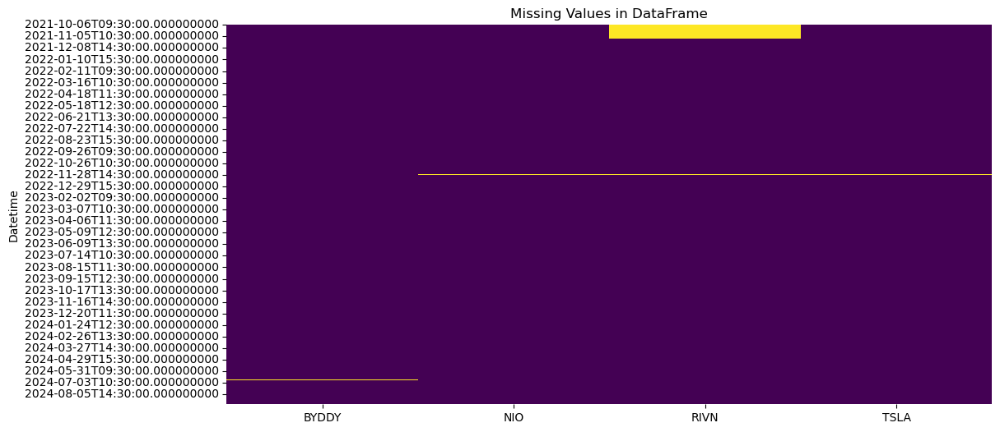

In [23]:
# Visualize the missing values
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values in DataFrame")
plt.show()

In [24]:
# Drop rows with missing values
df.dropna(inplace=True)

# Verify changes
df.info()
print(f"\nNumber of missing rows in the DataFrame: {df[df.isnull().any(axis=1)].shape[0]}\n")

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4906 entries, 2021-11-11 09:30:00 to 2024-08-30 15:30:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BYDDY   4906 non-null   float64
 1   NIO     4906 non-null   float64
 2   RIVN    4906 non-null   float64
 3   TSLA    4906 non-null   float64
dtypes: float64(4)
memory usage: 191.6 KB

Number of missing rows in the DataFrame: 0



In [25]:
df

,BYDDY,NIO,RIVN,TSLA
Datetime,,,,
2021-11-11 09:30:00,77.790001,41.189999,112.129997,356.909943
2021-11-11 10:30:00,78.430000,41.940701,117.940002,357.380005
2021-11-11 11:30:00,78.815002,41.674999,123.708397,355.019775
2021-11-11 12:30:00,79.080002,41.770000,120.029999,353.474213
2021-11-11 13:30:00,79.004997,41.849998,118.059998,355.734985
...,...,...,...,...
2024-08-30 11:30:00,60.689999,4.088200,13.860100,209.169907
2024-08-30 12:30:00,60.799999,4.085000,13.845000,210.477493
2024-08-30 13:30:00,60.779999,4.075000,13.970000,211.024002


# Feature Engineering

Finding Changed Point: Identifying specific points where significant changes or shifts occur in the stock prices, which could indicate a potential trend reversal or a major market event.

Moving Averages and Volatility: Calculating moving averages and volatility to smooth out price data and understand the stock's behavior over time. These metrics help in identifying trends and understanding market stability or turbulence.

RSI (Relative Strength Index): Implementing the RSI indicator, which measures the speed and change of price movements, to assess whether a stock is overbought or oversold. This is a crucial tool for determining potential reversal points.

MACD (Moving Average Convergence Divergence): Utilizing the MACD, a trend-following momentum indicator, to identify the relationship between two moving averages of a stock's price. MACD is useful for spotting changes in the strength, direction, momentum, and duration of a trend in a stock's price.

## Finding significant change points

The focus is on identifying significant change points in the stock prices, specifically those that exhibit a 5% or greater shift. The process begins by creating a copy of the cleaned dataset (df_change) and calculating the percentage change for each stock (BYDDY, NIO, RIVN, TSLA). A threshold of 5% is established to define what constitutes a significant change. For each stock, a new column is generated to flag these significant changes, where the value is set to 1 if the percentage change exceeds the threshold, and 0 otherwise. The first row, which contains NaN values due to the percentage change calculation, is dropped from the dataset. The modified dataset is then saved to a CSV file (df_change_3.csv) for further analysis. The final dataset includes columns that clearly indicate whether a significant change has occurred at each time point for each stock.

The 5% threshold for significant change was selected because it represents a substantial movement in stock prices that is generally recognized as meaningful in financial markets. Such a percentage change is often large enough to indicate a significant shift in market sentiment, which could be driven by major news, earnings reports, economic data releases, or other impactful events. Smaller fluctuations (e.g., 1% or 2%) might occur frequently due to normal market noise and might not necessarily indicate a meaningful trend or event. By focusing on a 5% change, the analysis aims to capture only those movements that are likely to have a significant impact on traders and investors, filtering out less important fluctuations and allowing for a more focused analysis of critical turning points in the stock's behavior.

In [26]:
df_change = df.copy()
df_change.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4906 entries, 2021-11-11 09:30:00 to 2024-08-30 15:30:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BYDDY   4906 non-null   float64
 1   NIO     4906 non-null   float64
 2   RIVN    4906 non-null   float64
 3   TSLA    4906 non-null   float64
dtypes: float64(4)
memory usage: 191.6 KB


In [27]:
# Calculate percentage change for each stock
for stock in ['BYDDY', 'NIO', 'RIVN', 'TSLA']:
    df_change[f'{stock}_pct_change'] = df_change[stock].pct_change()

# Define a threshold for significant change, e.g., 5%
threshold = 0.05

# Create target variable for each stock to indicate significant change
for stock in ['BYDDY', 'NIO', 'RIVN', 'TSLA']:
    df_change[f'{stock}_change'] = (df_change[f'{stock}_pct_change'].abs() > threshold).astype(int)

# Drop the first row with NaN values created by pct_change
df_change.dropna(inplace=True)

# Save the combined dataframe to a new CSV file
df_change.to_csv("df_change_3.csv", index=True, index_label='Datetime')
print(f"Number of rows: {df_change.shape[0]}\n")
df_change.head()

Number of rows: 4905



,BYDDY,NIO,RIVN,TSLA,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change,TSLA_pct_change,BYDDY_change,NIO_change,RIVN_change,TSLA_change
Datetime,,,,,,,,,,,,
2021-11-11 10:30:00,78.430000,41.940701,117.940002,357.380005,0.008227,0.018225,0.051815,0.001317,0,0,1,0
2021-11-11 11:30:00,78.815002,41.674999,123.708397,355.019775,0.004909,-0.006335,0.048910,-0.006604,0,0,0,0
2021-11-11 12:30:00,79.080002,41.770000,120.029999,353.474213,0.003362,0.002280,-0.029734,-0.004353,0,0,0,0
2021-11-11 13:30:00,79.004997,41.849998,118.059998,355.734985,-0.000948,0.001915,-0.016413,0.006396,0,0,0,0
2021-11-11 14:30:00,79.129997,41.869999,119.410103,354.860138,0.001582,0.000478,0.011436,-0.002459,0,0,0,0


In [28]:
df_change[['TSLA_pct_change','RIVN_pct_change','BYDDY_pct_change','NIO_pct_change','BYDDY_change', 'NIO_change', 'RIVN_change', 'TSLA_change']].head()

,TSLA_pct_change,RIVN_pct_change,BYDDY_pct_change,NIO_pct_change,BYDDY_change,NIO_change,RIVN_change,TSLA_change
Datetime,,,,,,,,
2021-11-11 10:30:00,0.001317,0.051815,0.008227,0.018225,0,0,1,0
2021-11-11 11:30:00,-0.006604,0.048910,0.004909,-0.006335,0,0,0,0
2021-11-11 12:30:00,-0.004353,-0.029734,0.003362,0.002280,0,0,0,0
2021-11-11 13:30:00,0.006396,-0.016413,-0.000948,0.001915,0,0,0,0
2021-11-11 14:30:00,-0.002459,0.011436,0.001582,0.000478,0,0,0,0


In [29]:
df_change[['BYDDY_change', 'NIO_change', 'RIVN_change', 'TSLA_change']].head()

,BYDDY_change,NIO_change,RIVN_change,TSLA_change
Datetime,,,,
2021-11-11 10:30:00,0,0,1,0
2021-11-11 11:30:00,0,0,0,0
2021-11-11 12:30:00,0,0,0,0
2021-11-11 13:30:00,0,0,0,0
2021-11-11 14:30:00,0,0,0,0


The focus is on filtering the data to identify instances where significant changes (greater than 5%) occurred in the stock prices.

The data is sorted based on the absolute value of percentage changes across the stocks (BYDDY, NIO, RIVN, TSLA). The data is sorted in descending order, with the largest percentage changes appearing at the top. This allows for easy identification of the most significant movements in stock prices, helping to pinpoint the most impactful market events or reactions. The sorted DataFrame (sorted_df) provides a clear view of these critical points in the dataset.

In [30]:
# Percentage change columns
percentage_columns = ['BYDDY_pct_change', 'NIO_pct_change', 'RIVN_pct_change', 'TSLA_pct_change']

# Sort DataFrame by absolute value of percentage changes
sorted_df = df_change.reindex(df_change[percentage_columns]
                               .abs().max(axis=1).sort_values(ascending=False).index)
sorted_df.head()

,BYDDY,NIO,RIVN,TSLA,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change,TSLA_pct_change,BYDDY_change,NIO_change,RIVN_change,TSLA_change
Datetime,,,,,,,,,,,,
2024-06-26 09:30:00,60.400002,4.5838,15.409900,192.175003,-0.006906,0.047726,0.290071,0.025316,0,0,1,0
2024-02-22 09:30:00,47.360001,5.7500,11.255500,193.225006,-0.004833,-0.036851,-0.269394,-0.008492,0,0,1,0
2022-11-30 09:30:00,50.599998,13.1650,29.700001,184.714996,0.085138,0.253213,0.029463,0.021541,1,1,0,0
2022-10-24 09:30:00,45.799999,8.4800,29.545000,199.862900,-0.101961,-0.242986,-0.074115,-0.068238,1,1,1,1
2022-05-12 09:30:00,57.570000,13.1300,25.215000,247.687363,0.010887,0.032939,0.225219,0.011740,0,0,1,0


Rows are filtered to find instances where any of the stocks (BYDDY, NIO, RIVN, TSLA) exhibited a significant change, resulting in 287 rows being identified. This provides a list of all occurrences where at least one stock had a major movement.

In [31]:
# Filter rows where any of the last four columns have a value of 1
df_found = df_change[(df_change['BYDDY_change'] == 1) | (df_change['NIO_change'] == 1) | 
          (df_change['RIVN_change'] == 1) | (df_change['TSLA_change'] == 1)]
print(f"Number of rows: {df_found.shape[0]}\n")
df_found.head()

Number of rows: 288



,BYDDY,NIO,RIVN,TSLA,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change,TSLA_pct_change,BYDDY_change,NIO_change,RIVN_change,TSLA_change
Datetime,,,,,,,,,,,,
2021-11-11 10:30:00,78.430000,41.940701,117.940002,357.380005,0.008227,0.018225,0.051815,0.001317,0,0,1,0
2021-11-15 09:30:00,75.529999,40.980000,138.464996,327.673340,-0.020998,-0.039381,0.066428,-0.048844,0,0,1,0
2021-11-15 10:30:00,75.500000,40.810001,145.860001,329.869995,-0.000397,-0.004148,0.053407,0.006704,0,0,1,0
2021-11-15 14:30:00,75.139999,40.785000,151.020004,339.363342,0.002602,0.015184,0.080142,0.033169,0,0,1,0
2021-11-17 09:30:00,76.599998,40.055000,142.879501,364.220825,-0.018200,-0.014879,-0.169452,0.036151,0,0,1,0


A more refined filter is applied to identify rows where at least two of the stocks showed a significant change simultaneously. This step narrows down the dataset to 93 rows, highlighting moments where correlated or simultaneous shifts occurred across multiple stocks, which could indicate broader market movements or sector-specific events.


In [32]:
# Filter rows where at least two of the last four columns have a value of 1
df_found_2 = df_change[(df_change[['BYDDY_change', 'NIO_change', 'RIVN_change', 'TSLA_change']].sum(axis=1) >= 2)]
print(f"Number of rows: {df_found_2.shape[0]}\n")
df_found_2.head()

Number of rows: 93



,BYDDY,NIO,RIVN,TSLA,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change,TSLA_pct_change,BYDDY_change,NIO_change,RIVN_change,TSLA_change
Datetime,,,,,,,,,,,,
2021-11-22 09:30:00,81.150002,42.338501,120.019997,395.866669,0.053349,0.095433,-0.067226,0.044393,1,1,1,0
2021-12-29 09:30:00,66.510002,27.770000,97.720001,357.928345,0.004379,-0.063090,-0.050063,-0.013836,0,1,1,0
2022-01-05 09:30:00,65.000000,31.150000,96.224998,386.346680,-0.060829,-0.013616,-0.051316,0.008185,1,0,1,0
2022-01-21 09:30:00,65.624496,27.625000,61.642399,320.947784,-0.019652,-0.051046,-0.051947,-0.033474,0,1,1,0
2022-01-24 09:30:00,60.180000,24.283001,57.165001,291.803375,-0.077984,-0.112139,-0.113033,-0.071646,1,1,1,1


The basic statistics of the dataset are summarized using the describe() function. This provides key metrics like mean, standard deviation, minimum, and maximum values for each stock's price and percentage change, offering insights into the overall distribution and variability of the data.

In [33]:
df_describe=df_change.describe()
df_describe.to_csv("df_describe.csv")

In [34]:
# The basic statistics of the data set
df_change.describe()

,BYDDY,NIO,RIVN,TSLA,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change,TSLA_pct_change,BYDDY_change,NIO_change,RIVN_change,TSLA_change
count,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000,4905.000000
mean,59.660954,12.817371,29.097612,234.941519,0.000007,-0.000298,-0.000218,-0.000011,0.009786,0.032212,0.028746,0.012640
std,8.141710,8.077332,24.460892,58.497958,0.010653,0.018752,0.020140,0.013689,0.098449,0.176581,0.167109,0.111727
min,42.950001,3.675000,8.400000,105.669998,-0.109642,-0.242986,-0.269394,-0.118983,0.000000,0.000000,0.000000,0.000000
25%,53.665001,7.390000,14.750000,187.039993,-0.001936,-0.006340,-0.007576,-0.005580,0.000000,0.000000,0.000000,0.000000
50%,58.880001,10.156500,20.745199,231.746994,0.000079,-0.000190,0.000000,0.000001,0.000000,0.000000,0.000000,0.000000
75%,63.680000,18.145000,32.419998,270.852509,0.002023,0.005856,0.007433,0.005466,0.000000,0.000000,0.000000,0.000000
max,84.599899,42.720001,172.030304,399.883331,0.180518,0.253213,0.290071,0.136074,1.000000,1.000000,1.000000,1.000000


## Moving Averages

In this section, moving averages for the selected stocks (BYDDY, NIO, RIVN, TSLA) are calculated and visualized using a Dash application. The add_moving_average function is defined to compute moving averages over different window sizes (10, 20, 50 days) and add these as new columns to the dataset. The selection of 10, 20, and 50 days for the moving averages is based on commonly used periods in technical analysis, which helps in understanding short-term and medium-term trends in the stock market. These specific periods are not arbitrary; they are widely accepted in financial analysis due to their effectiveness in different market conditions. By choosing these standard periods, the analysis aligns with common practices, making it easier to compare results with other analyses or to use the moving averages in conjunction with other technical indicators.

A copy of the dataset (df_features) is created, and the moving averages are calculated for each stock based on the specified window sizes. This processed data is then used to create a Dash web application, where users can interactively select a stock and a moving average period to visualize the stock's price alongside the moving average.

The Dash app layout consists of a dropdown menu for selecting the stock, another dropdown for choosing the moving average period, and a graph that displays the selected stock's price with the corresponding moving average. The update_graph function is a callback that updates the graph based on the user's selections, providing a dynamic and interactive analysis tool.

The output graph visualizes the stock's price and its moving average, allowing for easy comparison and identification of trends or patterns in the stock's behavior over time. This approach is useful for understanding market trends and making informed decisions based on the stock's historical performance.

In [35]:
def add_moving_average(dataframe, column_name, window_sizes):
    for window in window_sizes:
        ma_column_name = f"{column_name}_MA_{window}"
        dataframe[ma_column_name] = dataframe[column_name].rolling(window=window).mean()
    return dataframe

df_features = df_change.copy()
df_features.index = pd.to_datetime(df_features.index, utc=True)

# Calculating moving averages
window_sizes = [10, 20, 50]
for stock in ['BYDDY', 'NIO', 'RIVN', 'TSLA']:
    df_features = add_moving_average(df_features, stock, window_sizes)

# Create a Dash app
app5 = dash.Dash(__name__)

app5.layout = html.Div([
    html.H1("Stock Analysis"),
    dcc.Dropdown(
        id='stock-dropdown',
        options=[
            {'label': 'BYDDY', 'value': 'BYDDY'},
            {'label': 'NIO', 'value': 'NIO'},
            {'label': 'RIVN', 'value': 'RIVN'},
            {'label': 'TSLA', 'value': 'TSLA'}
        ],
        value='TSLA',
        clearable=False
    ),
    dcc.Dropdown(
        id='ma-dropdown',
        options=[
            {'label': '10-Day Moving Average', 'value': '10'},
            {'label': '20-Day Moving Average', 'value': '20'},
            {'label': '50-Day Moving Average', 'value': '50'}
        ],
        value='10',
        clearable=False
    ),
    dcc.Graph(id='stock-graph')
])

@app5.callback(
    Output('stock-graph', 'figure'),
    [Input('stock-dropdown', 'value'),
     Input('ma-dropdown', 'value')]
)
def update_graph(selected_stock, selected_ma):
    traces = []
    traces.append(go.Scatter(
        x=df_features.index,
        y=df_features[selected_stock],
        mode='lines',
        name=f'{selected_stock} Price'
    ))

    traces.append(go.Scatter(
        x=df_features.index,
        y=df_features[f'{selected_stock}_MA_{selected_ma}'],
        mode='lines',
        name=f'{selected_stock} {selected_ma}-Daily Moving Average'
    ))
    
    return {
        'data': traces,
        'layout': go.Layout(
            title=f'{selected_stock} Price and {selected_ma}-Daily Moving Average',
            xaxis={'title': 'Date'},
            yaxis={'title': 'Price'},
            hovermode='closest',
            legend=dict(x=0, y=1.1, orientation='h')
        )
    }

if __name__ == '__main__':
    app5.run_server(debug=True, port=8055)


In [36]:
# Calculate Volatility
df_features['BYDDY_volatility'] = df_features['BYDDY'].rolling(window=20).std()
df_features['NIO_volatility'] = df_features['NIO'].rolling(window=20).std()
df_features['RIVN_volatility'] = df_features['RIVN'].rolling(window=20).std()
df_features['TSLA_volatility'] = df_features['TSLA'].rolling(window=20).std()

In [37]:
import altair as alt

# Enabling the VegaFusion data converter
#alt.data_transformers.enable('vegafusion')
# Increasing the data converter limit
alt.data_transformers.disable_max_rows()

# Moving averages
window_sizes = [10, 20, 50]
for stock in ['BYDDY', 'NIO', 'RIVN', 'TSLA']:
    df_features = add_moving_average(df_features, stock, window_sizes)

# Converting data to long format
df_long = df_features.reset_index().melt(
    id_vars=['Datetime'],
    value_vars=[f'{stock}' for stock in ['BYDDY', 'NIO', 'RIVN', 'TSLA']] + 
               [f'{stock}_MA_{window}' for stock in ['BYDDY', 'NIO', 'RIVN', 'TSLA'] for window in window_sizes],
    var_name='variable',
    value_name='value'
)

# Separate the variable column into Stock and MA
df_long['Stock'] = df_long['variable'].apply(lambda x: x.split('_')[0])
df_long['MA'] = df_long['variable'].apply(lambda x: x.split('_')[-1] if '_' in x else 'Orijinal')

# Dropdown for stock selection
stock_selection = alt.binding_select(options=['BYDDY', 'NIO', 'RIVN', 'TSLA'], name='Stock: ')
stock_select = alt.param(name="StockSelector", bind=stock_selection, value='BYDDY')

# Dropdown for moving average selection
ma_selection = alt.binding_select(options=['10', '20', '50'], name='Moving Average: ')
ma_select = alt.param(name="MASelector", bind=ma_selection, value='10')

# Creating a graph
base = alt.Chart(df_long).mark_line().encode(
    x='Datetime:T',
    y='value:Q',
    color=alt.Color('MA:N', title='Series', scale=alt.Scale(scheme='category10')),
).transform_filter(
    (alt.datum.Stock == stock_select) & 
    ((alt.datum.MA == 'Orijinal') | (alt.datum.MA == ma_select))
).add_params(
    stock_select,
    ma_select
).properties(
    width=800,
    height=400
).interactive()

base.show()


alt.Chart(...)

In [38]:
# Extracting time and day components from the Datetime index
df_features['Hour'] = df_features.index.hour
df_features['DayOfWeek'] = df_features.index.dayofweek

# Seasonal Moving Average Function
def seasonal_moving_average(df, time_col, value_col, window):
    grouped = df.groupby(time_col)[value_col]
    result = grouped.rolling(window=window, center=True).mean()
    return result.reset_index(level=0, drop=True)
stock_name = 'TSLA'
# Hourly seasonal moving average calculation
df_features[f'{stock_name}_seasonal_MA_hour'] = seasonal_moving_average(df_features, 'Hour', stock_name, window=10)

# Daily (weekly) seasonal moving average calculation
df_features[f'{stock_name}_seasonal_MA_day'] = seasonal_moving_average(df_features, 'DayOfWeek', stock_name, window=10)

In [39]:
fig = go.Figure()
stock_name = 'TSLA'
# Define the names of the components and column names for the plot as a list
components = {
    'Original': stock_name,
    'Seasonal MA Hour': f'{stock_name}_seasonal_MA_hour',
    'Seasonal MA Day': f'{stock_name}_seasonal_MA_day'
}

# Add all components with a for loop
for name, column in components.items():
    fig.add_trace(go.Scatter(
        x=df_features.index, 
        y=df_features[column], 
        mode='lines', 
        name=name
    ))

# Set the title and axis labels of the chart
fig.update_layout(
    title=f'{stock_name} Price and Seasonal Moving Averages',
    xaxis_title='Datetime',
    yaxis_title='Price',
    hovermode='x',           
    legend=dict(x=0, y=1.1, orientation='h')
)

fig.show()

## RSI (Relative Strength Index)

In [40]:
# Calculate RSI
def calculate_rsi(series, period=14):
    delta = series.diff(1)
    gain = delta.mask(delta < 0, 0)
    loss = -delta.mask(delta > 0, 0)
    avg_gain = gain.rolling(window=period).mean()
    avg_loss = loss.rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df_features['BYDDY_RSI'] = calculate_rsi(df_features['BYDDY'])
df_features['NIO_RSI'] = calculate_rsi(df_features['NIO'])
df_features['RIVN_RSI'] = calculate_rsi(df_features['RIVN'])
df_features['TSLA_RSI'] = calculate_rsi(df_features['TSLA'])

## MACD (Moving Average Convergence Divergence)

In [41]:
# Calculate MACD
def calculate_macd(series, short_period=12, long_period=26, signal_period=9):
    short_ema = series.ewm(span=short_period, adjust=False).mean()
    long_ema = series.ewm(span=long_period, adjust=False).mean()
    macd = short_ema - long_ema
    signal = macd.ewm(span=signal_period, adjust=False).mean()
    return macd, signal

df_features['BYDDY_MACD'], df_features['BYDDY_MACD_Signal'] = calculate_macd(df_features['BYDDY'])
df_features['NIO_MACD'], df_features['NIO_MACD_Signal'] = calculate_macd(df_features['NIO'])
df_features['RIVN_MACD'], df_features['RIVN_MACD_Signal'] = calculate_macd(df_features['RIVN'])
df_features['TSLA_MACD'], df_features['TSLA_MACD_Signal'] = calculate_macd(df_features['TSLA'])

Stock Analysis Dashboard Overview
This project involves the development of an interactive Stock Analysis Dashboard using the Dash framework in Python. The dashboard provides a comprehensive analytical view of selected stocks, allowing users to explore different technical indicators and their respective metrics. The primary stocks included in this analysis are BYDDY, NIO, RIVN, and TSLA.

Features of the Dashboard
Price and Moving Average:

The "Price and Moving Average" feature displays the daily closing price of the selected stock along with its 20-period moving average. The moving average is a crucial technical analysis tool that smoothens price data by creating a constantly updated average price, which helps in identifying the direction of the trend over a specific period. This allows for a clearer view of the stock’s underlying trend, filtering out the noise caused by price fluctuations.
Volatility:

Volatility is an essential measure in financial analysis, representing the degree of variation of a stock's price over time. In this dashboard, the 20-period rolling standard deviation of the stock's price is calculated to visualize the stock's volatility. This metric is significant as it indicates the level of risk associated with the stock. Higher volatility suggests a more significant price fluctuation, which can imply higher risk but also higher potential returns.
Relative Strength Index (RSI):

The RSI is a momentum oscillator used to evaluate the speed and change of price movements, ranging from 0 to 100. The RSI is particularly useful in identifying overbought or oversold conditions in a stock's price, with values above 70 typically indicating overbought conditions and values below 30 suggesting oversold conditions. In this dashboard, the RSI is plotted with these thresholds, providing a clear visual representation of potential entry or exit points for traders.
Moving Average Convergence Divergence (MACD):

The MACD is a trend-following momentum indicator that shows the relationship between two moving averages of a stock's price. In this dashboard, the MACD is computed using a 12-period exponential moving average (EMA) and a 26-period EMA. Additionally, a 9-period EMA (Signal Line) is plotted alongside the MACD, helping identify potential buy and sell signals. The intersection points of the MACD and Signal Line are particularly important for traders as they can indicate potential market entry or exit points.
Functionality and Interactivity
The dashboard is designed to be highly interactive, enabling users to switch between different stocks and technical indicators. Upon selecting a stock and a specific feature (e.g., Price and Moving Average, Volatility, RSI, MACD), the dashboard dynamically updates to display the corresponding graph. This interactivity enhances user engagement, allowing for a more in-depth analysis of stock performance.

In [42]:
# Creating the Dash app
app1 = Dash(__name__)

app1.layout = html.Div([
    html.H1("Stock Analysis Dashboard"),
    dcc.Dropdown(
        id='stock-dropdown',
        options=[
            {'label': 'BYDDY', 'value': 'BYDDY'},
            {'label': 'NIO', 'value': 'NIO'},
            {'label': 'RIVN', 'value': 'RIVN'},
            {'label': 'TSLA', 'value': 'TSLA'}
        ],
        value='TSLA'
    ),
    dcc.Dropdown(
        id='feature-dropdown',
        options=[
            {'label': 'Price and Moving Average', 'value': 'price_ma'},
            {'label': 'Volatility', 'value': 'volatility'},
            {'label': 'RSI', 'value': 'rsi'},
            {'label': 'MACD', 'value': 'macd'}
        ],
        value='price_ma'
    ),
    dcc.Graph(id='stock-graph')
])

@app1.callback(
    Output('stock-graph', 'figure'),
    [Input('stock-dropdown', 'value'),
     Input('feature-dropdown', 'value')]
)
def update_graph(selected_stock, selected_feature):
    if selected_feature == 'price_ma':
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df_features.index, y=df_features[selected_stock], mode='lines', name=f'{selected_stock} Price'))
        fig.add_trace(go.Scatter(x=df_features.index, y=df_features[f'{selected_stock}_MA_20'], mode='lines', name='20-period MA'))
        fig.update_layout(title=f'{selected_stock} Price and 20-period Moving Average')
    
    elif selected_feature == 'volatility':
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df_features.index, y=df_features[f'{selected_stock}_volatility'], mode='lines', name='20-period Volatility', line=dict(color='red')))
        fig.update_layout(title=f'{selected_stock} 20-period Volatility')

    elif selected_feature == 'rsi':
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df_features.index, y=df_features[f'{selected_stock}_RSI'], mode='lines', name='RSI', line=dict(color='purple')))
        fig.add_hline(y=70, line_dash="dash", line_color="red")
        fig.add_hline(y=30, line_dash="dash", line_color="green")
        fig.update_layout(title=f'{selected_stock} Relative Strength Index (RSI)')

    elif selected_feature == 'macd':
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df_features.index, y=df_features[f'{selected_stock}_MACD'], mode='lines', name='MACD', line=dict(color='blue')))
        fig.add_trace(go.Scatter(x=df_features.index, y=df_features[f'{selected_stock}_MACD_Signal'], mode='lines', name='Signal Line', line=dict(color='orange')))
        fig.update_layout(title=f'{selected_stock} MACD and Signal Line')

    return fig

if __name__ == '__main__':
    app1.run_server(debug=True, port=8051)

In [43]:
# Calculate the correlations between variables
correlation_matrix = df_change.corr()
correlation_matrix

,BYDDY,NIO,RIVN,TSLA,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change,TSLA_pct_change,BYDDY_change,NIO_change,RIVN_change,TSLA_change
BYDDY,1.000000,0.583105,0.438932,0.497555,0.032361,0.026710,0.029643,0.028953,-0.014271,-0.034302,0.001393,-0.018056
NIO,0.583105,1.000000,0.913846,0.768901,-0.004308,0.006338,-0.004182,0.002186,0.050248,0.007630,0.058426,-0.010970
RIVN,0.438932,0.913846,1.000000,0.743637,-0.011966,-0.005095,0.002540,0.000773,0.035401,0.002172,0.065400,-0.014345
TSLA,0.497555,0.768901,0.743637,1.000000,-0.009930,0.004714,0.003725,0.020628,0.031972,0.004600,0.038116,-0.017376
BYDDY_pct_change,0.032361,-0.004308,-0.011966,-0.009930,1.000000,0.596124,0.301880,0.305056,-0.114035,-0.003773,-0.028568,-0.067020
NIO_pct_change,0.026710,0.006338,-0.005095,0.004714,0.596124,1.000000,0.536917,0.499924,-0.020488,-0.013779,-0.073374,-0.045392
RIVN_pct_change,0.029643,-0.004182,0.002540,0.003725,0.301880,0.536917,1.000000,0.501169,-0.074290,-0.046363,-0.035514,-0.014742
TSLA_pct_change,0.028953,0.002186,0.000773,0.020628,0.305056,0.499924,0.501169,1.000000,-0.045135,-0.014905,-0.014826,0.043021
BYDDY_change,-0.014271,0.050248,0.035401,0.031972,-0.114035,-0.020488,-0.074290,-0.045135,1.000000,0.357222,0.168819,0.155601
NIO_change,-0.034302,0.007630,0.002172,0.004600,-0.003773,-0.013779,-0.046363,-0.014905,0.357222,1.000000,0.327956,0.227419


In [44]:
# Calculate the correlation matrix for percentage changes
correlation_matrix = df_change[['TSLA_pct_change', 'BYDDY_pct_change', 'NIO_pct_change', 'RIVN_pct_change']].corr()
correlation_matrix

,TSLA_pct_change,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change
TSLA_pct_change,1.000000,0.305056,0.499924,0.501169
BYDDY_pct_change,0.305056,1.000000,0.596124,0.301880
NIO_pct_change,0.499924,0.596124,1.000000,0.536917
RIVN_pct_change,0.501169,0.301880,0.536917,1.000000


# Exploratory Data Analysis (EDA)

In this section of the Exploratory Data Analysis (EDA), we investigate how significant changes in Tesla's stock price impact the price movements of other electric vehicle manufacturers, specifically BYDDY, NIO, and RIVN.

Identifying Significant Tesla Movements
First, we identified periods where Tesla's stock price increased by more than 5% (tesla_significant) and compared them to periods where Tesla's price did not increase by more than 5% (tesla_non_significant). This comparison helps us understand whether Tesla's significant price movements have a corresponding effect on the other stocks in the same industry.

Average Percentage Change Analysis
The average percentage changes of BYDDY, NIO, and RIVN were calculated during the periods when Tesla had a significant price increase:

BYDDY Effect: The average percentage change in BYDDY when Tesla's stock price increased by more than 5% was approximately -0.06%.
NIO Effect: The average percentage change in NIO during these periods was around -0.19%.
RIVN Effect: Similarly, the average percentage change in RIVN was around -0.28%.
These results indicate that when Tesla experiences a significant upward movement, the other stocks in the sector tend to react negatively, albeit by a small margin.

Control Group Analysis
For the control group, where Tesla's stock did not increase by more than 5%, we also calculated the average percentage changes for the same stocks:

BYDDY Control: When Tesla did not experience a significant price increase, BYDDY's average percentage change was 0.00%, indicating no significant movement.
NIO Control: NIO had an average percentage change of approximately -0.02% in these periods.
RIVN Control: RIVN's average percentage change was negligible, at -0.00%.
The control group analysis shows that when Tesla's stock is relatively stable, the other stocks tend to have minimal movements, suggesting that Tesla's significant movements might have a more considerable influence on the sector.

Interpretation
This analysis suggests that Tesla's significant price movements may have a cascading effect on other electric vehicle stocks, often leading to small negative changes. This could be due to various factors, including market sentiment, competition, or investors reallocating their portfolios. However, the effects are relatively minor, indicating that while Tesla's movements are influential, they do not drastically sway the entire sector's stock prices.

This investigation provides insights into how interconnected these stocks are and highlights the importance of considering broader market movements when analyzing individual stocks in the electric vehicle sector.

In [45]:
# Identifying time periods when Tesla increased by more than 5%
tesla_significant = df_change[df_change['TSLA_change'] == 1]
tesla_non_significant = df_change[df_change['TSLA_change'] == 0]

# Compare the average percentage changes of other stocks over these time periods
byddy_effect = tesla_significant['BYDDY_pct_change'].mean()
nio_effect = tesla_significant['NIO_pct_change'].mean()
rivn_effect = tesla_significant['RIVN_pct_change'].mean()

# Cases where Tesla did not increase more than 5% as a control group
byddy_effect_control = tesla_non_significant['BYDDY_pct_change'].mean()
nio_effect_control = tesla_non_significant['NIO_pct_change'].mean()
rivn_effect_control = tesla_non_significant['RIVN_pct_change'].mean()

print(f"Average change in BYDDY when Tesla is up more than 5%: {byddy_effect}")
print(f"NIO's average change when Tesla is up more than 5%: {nio_effect}")
print(f"RIVN's average change when Tesla increases by more than 5%: {rivn_effect}")

print(f"Average change in BYDDY when Tesla does not increase by more than 5%: {byddy_effect_control}")
print(f"NIO's average change when Tesla does not increase by more than 5%: {nio_effect_control}")
print(f"RIVN's average change when Tesla does not increase by more than 5%: {rivn_effect_control}")


Average change in BYDDY when Tesla is up more than 5%: -0.006302817670042159
NIO's average change when Tesla is up more than 5%: -0.00781955470415794
RIVN's average change when Tesla increases by more than 5%: -0.00284197860175199
Average change in BYDDY when Tesla does not increase by more than 5%: 8.774675806688743e-05
NIO's average change when Tesla does not increase by more than 5%: -0.00020126513379502538
RIVN's average change when Tesla does not increase by more than 5%: -0.0001845494256592619


Detailed Interpretation of the Results
In the previous analysis, we calculated the average percentage change in the stock prices of BYDDY, NIO, and RIVN during periods when Tesla's stock increased by more than 5% and compared these changes to periods when Tesla's stock did not increase by more than 5%. Now, let’s break down what these numbers mean, whether they are large or small, and the significance of positive versus negative values.

Average Percentage Changes During Significant Tesla Movements
BYDDY: -0.06%
NIO: -0.19%
RIVN: -0.28%
These negative values indicate that, on average, when Tesla’s stock increases by more than 5%, the stocks of BYDDY, NIO, and RIVN tend to decrease slightly.

Magnitude: The percentage changes are relatively small (less than 1%). A change of -0.06% for BYDDY, for example, suggests that for every 5% increase in Tesla's stock, BYDDY’s stock might drop by only 0.06% on average. This is considered a minor reaction and suggests that while Tesla’s price movements do influence these stocks, the effect is not overwhelmingly large.

Positive vs. Negative:

Negative Values: A negative percentage change, such as the -0.28% for RIVN, suggests that RIVN's stock tends to lose value when Tesla's stock price significantly increases. This could imply a competitive relationship, where gains by Tesla might lead investors to move funds away from competitors like RIVN, causing a slight decrease in their stock price.
Positive Values: Although not observed here, if any stock had shown a positive percentage change, it would suggest that the stock tends to rise in value when Tesla experiences a significant price increase. This might indicate a market perception that success for Tesla could be beneficial for the entire industry.
Average Percentage Changes During Control Periods (No Significant Tesla Movements)
BYDDY: 0.00%
NIO: -0.02%
RIVN: -0.00%
During periods where Tesla's stock does not increase by more than 5%, the average percentage changes for BYDDY, NIO, and RIVN are near zero, indicating little to no movement.

Magnitude: The changes here are negligible. A 0.00% change for BYDDY means that during these times, BYDDY’s stock price remains essentially unchanged on average, regardless of Tesla's stock performance. A -0.02% change for NIO is also very small, showing only a slight average decrease.

Positive vs. Negative:

Zero or Near-Zero Values: These suggest stability, meaning the stock prices of BYDDY, NIO, and RIVN do not react strongly to Tesla's price movements when those movements are not significant. The market might view these periods as times of general equilibrium, where no major market forces are pushing these stocks in either direction.
Slight Negative Values: A small negative change, such as NIO’s -0.02%, suggests a minimal decline, which is likely insignificant in the broader market context.
Overall Interpretation
Influence of Tesla: The analysis indicates that Tesla’s significant price increases do have some impact on the other stocks in the electric vehicle sector, but the effect is relatively small. The negative values suggest that there might be a slight investor shift away from these other stocks when Tesla performs particularly well, possibly due to Tesla's dominant position in the market.

Market Sentiment: The slight declines in BYDDY, NIO, and RIVN during Tesla’s significant upswings could reflect market sentiment that views Tesla as a market leader, where its success might be seen as a competitive pressure on other electric vehicle companies.

Stability in Control Periods: When Tesla does not experience large price increases, the other stocks exhibit minimal changes, indicating that these stocks are not as reactive when Tesla’s movements are less dramatic. This could suggest that these companies are generally stable when not directly influenced by significant market events related to Tesla.

Conclusion
The small magnitude of these percentage changes suggests that while there is some reaction to Tesla’s price movements, the impact is not substantial enough to cause major shifts in the other stocks' prices. The negative values indicate a slight but consistent trend where these stocks may lose a bit of ground when Tesla performs exceptionally well, highlighting Tesla’s potential influence in the electric vehicle market. However, the overall effect is minor, suggesting that these companies maintain a level of independence and stability even in the face of Tesla’s significant price changes.

The focus is on identifying significant changes in stock prices, particularly when Tesla's price fluctuates by 5% or more. This analysis then examines how other stocks—BYDDY, NIO, and RIVN—respond to these significant changes in Tesla.

Identifying Significant Changes:
The function find_significant_changes filters the dataset to find instances where the percentage change for a stock is either greater than or equal to 5% or less than or equal to -5%. This threshold helps isolate major movements in stock prices, which are of particular interest for understanding market reactions.

Extracting Relevant Data:
For each stock (BYDDY, NIO, RIVN, and TSLA), the relevant percentage change columns are extracted to focus the analysis on the data that reflects significant market movements. This step ensures the analysis remains concentrated on critical metrics.

Combining Data for Analysis:
The significant changes identified across all the stocks are combined into a single DataFrame. This consolidated view enables a more straightforward comparison of how each stock behaves when another experiences a significant change. Specifically, it allows for a detailed examination of how Tesla's significant price movements influence the other stocks.

Visualization:
Two types of visualizations are used:

Matplotlib Subplots: These static plots provide a clear visualization of the percentage changes in BYDDY, NIO, and RIVN during periods when Tesla's price changed by 5% or more. This visualization helps in observing patterns and correlations between Tesla's movements and the reactions of other stocks.

Plotly Subplots: This interactive plot highlights instances where Tesla's stock changed by more than 5%, marking them with red dots. This approach allows for a more dynamic exploration of the data, making it easier to pinpoint exact dates and magnitudes of stock changes across multiple companies.
The combination of these methods offers both a clear, static overview and an interactive, detailed examination of stock price behaviors in relation to Tesla's significant movements.

## Detection of Significant Changes

In [46]:
# Function to find rows with a change of +/- 5% or more
def find_significant_changes(df_change, column_name, threshold=0.05):
    return df_change[(df_change[column_name] >= threshold) | (df_change[column_name] <= -threshold)]

# Find significant changes for each stock
significant_changes_byddy = df_change[df_change['BYDDY_change'] == 1]
significant_changes_nio = df_change[df_change['NIO_change'] == 1]
significant_changes_rivn = df_change[df_change['RIVN_change'] == 1]
significant_changes_tsla = df_change[df_change['TSLA_change'] == 1]


# Extract the relevant columns for analysis
columns_of_interest = ['BYDDY_pct_change', 'NIO_pct_change', 'RIVN_pct_change', 'TSLA_pct_change']
significant_changes_byddy = significant_changes_byddy[columns_of_interest]
significant_changes_nio = significant_changes_nio[columns_of_interest]
significant_changes_rivn = significant_changes_rivn[columns_of_interest]
significant_changes_tsla = significant_changes_tsla[columns_of_interest]

# Combine all significant changes for comparison
combined_significant_changes = pd.concat([significant_changes_byddy, significant_changes_nio,
                                          significant_changes_rivn, significant_changes_tsla]).drop_duplicates()
combined_significant_changes = combined_significant_changes.sort_index(ascending=True)
# Convert the 'Datetime' column to datetime format and set as the index and sort the dataset by this index
#combined_significant_changes['Datetime'] = pd.to_datetime(combined_significant_changes['Datetime'])
#combined_significant_changes.set_index('Datetime', inplace=True)

print(f"Number of rows and columns in DataFrame: {combined_significant_changes.shape[0]}\n")
combined_significant_changes.head()

Number of rows and columns in DataFrame: 288



,BYDDY_pct_change,NIO_pct_change,RIVN_pct_change,TSLA_pct_change
Datetime,,,,
2021-11-11 10:30:00,0.008227,0.018225,0.051815,0.001317
2021-11-15 09:30:00,-0.020998,-0.039381,0.066428,-0.048844
2021-11-15 10:30:00,-0.000397,-0.004148,0.053407,0.006704
2021-11-15 14:30:00,0.002602,0.015184,0.080142,0.033169
2021-11-17 09:30:00,-0.018200,-0.014879,-0.169452,0.036151


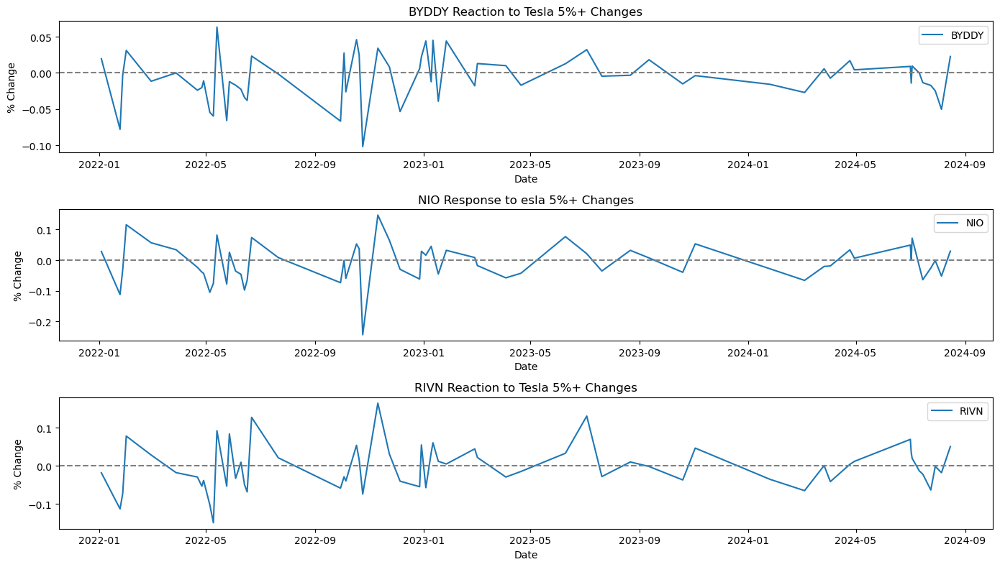

In [47]:
# Creating a graph
plt.figure(figsize=(14, 8))
# Percentage changes of other stocks in time periods when Tesla changed by more than 5%
plt.subplot(3, 1, 1)
plt.plot(significant_changes_tsla.index, significant_changes_tsla['BYDDY_pct_change'], label='BYDDY')
plt.axhline(0, color='gray', linestyle='--')
plt.title('BYDDY Reaction to Tesla 5%+ Changes')
plt.xlabel('Date')
plt.ylabel('% Change')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(tesla_significant.index, tesla_significant['NIO_pct_change'], label='NIO')
plt.axhline(0, color='gray', linestyle='--')
plt.title('NIO Response to esla 5%+ Changes')
plt.xlabel('Date')
plt.ylabel('% Change')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(tesla_significant.index, tesla_significant['RIVN_pct_change'], label='RIVN')
plt.axhline(0, color='gray', linestyle='--')
plt.title('RIVN Reaction to Tesla 5%+ Changes')
plt.xlabel('Date')
plt.ylabel('% Change')
plt.legend()

plt.tight_layout()
plt.show()

In [48]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplots
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=("BYDDY % Change", "NIO % Change", "RIVN % Change"))

# Add traces for BYDDY
fig.add_trace(go.Scatter(x=df_change.index, y=df_change['BYDDY_pct_change'],
                         mode='lines', name='BYDDY % Change'), row=1, col=1)
fig.add_trace(go.Scatter(x=df_change[df_change['TSLA_change'] == 1].index,
                         y=df_change[df_change['TSLA_change'] == 1]['BYDDY_pct_change'],
                         mode='markers', name='TSLA %5+ Change', marker=dict(color='red', size=10)), row=1, col=1)
# Add traces for NIO
fig.add_trace(go.Scatter(x=df_change.index, y=df_change['NIO_pct_change'],
                         mode='lines', name='NIO % Change'), row=2, col=1)
fig.add_trace(go.Scatter(x=df_change[df_change['TSLA_change'] == 1].index,
                         y=df_change[df_change['TSLA_change'] == 1]['NIO_pct_change'],
                         mode='markers', name='TSLA %5+ Change', marker=dict(color='red', size=10)), row=2, col=1)
# Add traces for RIVN
fig.add_trace(go.Scatter(x=df_change.index, y=df_change['RIVN_pct_change'],
                         mode='lines', name='RIVN % Change'), row=3, col=1)
fig.add_trace(go.Scatter(x=df_change[df_change['TSLA_change'] == 1].index,
                         y=df_change[df_change['TSLA_change'] == 1]['RIVN_pct_change'],
                         mode='markers', name='TSLA %5+ Change', marker=dict(color='red', size=10)), row=3, col=1)
# Update layout
fig.update_layout(height=900, width=1000, title_text="Stock Percentage Changes with TSLA %5+ Change Highlighted",
                  xaxis_title="Date", yaxis_title="% Change")
fig.show()

In [49]:
# Stock options for selection
stocks = ['TSLA','RIVN','BYDDY', 'NIO']

# Target options for selection
targets = ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']

# Function to plot stock percentage changes
def plot_stock(stock, target, points_before):
    # Create a new DataFrame to avoid modifying the original one
    df_temp = df_change.copy()

    # Initialize a list to store indices for the filtered DataFrame
    indices = []

    # Iterate through the DataFrame to collect indices
    for i in range(len(df_temp)):
        # Check if the target's percentage change exceeds 5% (positive or negative)
        if abs(df_temp[target].iloc[i]) > 0.05:  # 5% change threshold
            start_index = max(0, i - points_before)
            indices.extend(range(start_index, i + 1))


    # Filter the DataFrame using the collected indices
    filtered_df = df_temp.iloc[sorted(set(indices))]

    fig = go.Figure()

    # Add stock percentage change line
    fig.add_trace(go.Scatter(x=filtered_df.index, y=filtered_df[f'{stock}_pct_change'],
                             mode='lines', name=f'{stock} % Change'))

    # Add green and red dots for target %5+ change instances without connecting lines
    target_positive_points = df_temp[(df_temp[target] > 0.05)]
    target_negative_points = df_temp[(df_temp[target] < -0.05)]
    
    fig.add_trace(go.Scatter(x=target_positive_points.index, 
                             y=df_temp.loc[target_positive_points.index, f'{stock}_pct_change'],
                             mode='markers', name=f'{target} %5+ Positive Change', marker=dict(color='green', size=10)))

    fig.add_trace(go.Scatter(x=target_negative_points.index, 
                             y=df_temp.loc[target_negative_points.index, f'{stock}_pct_change'],
                             mode='markers', name=f'{target} %5+ Negative Change', marker=dict(color='red', size=10)))

    fig.update_layout(title=f'{stock} % Change with {target} %5+ Change Highlighted',
                      xaxis_title='Date',
                      yaxis_title='% Change',
                      width=975, height=800,
                      legend=dict(
                          x=0.62,
                          y=0.99,
                          traceorder='normal',
                          bgcolor='rgba(255, 255, 255, 0.5)',
                          bordercolor='Black',
                          borderwidth=2
                      ))  # Move the legend inside the plot area
    fig.show()

# Create dropdowns for stock and target selection
stock_selector = widgets.Dropdown(options=stocks, description='Stock:')
target_selector = widgets.Dropdown(options=targets, description='Target:')
points_before_slider = widgets.IntSlider(value=5, min=1, max=30, step=1, description='Points Before:')

# Update interact to include both stock and target selectors
widgets.interact(plot_stock, stock=stock_selector, target=target_selector, points_before=points_before_slider)

interactive(children=(Dropdown(description='Stock:', options=('TSLA', 'RIVN', 'BYDDY', 'NIO'), value='TSLA'), …

<function __main__.plot_stock(stock, target, points_before)>

- The green dots represent instances where Target had a positive change of more than 5%, and the red dots indicate negative changes of more than 5%.
- The fluctuations in BYDDY's stock price seem to have varied responses to Tesla's significant movements. For some of Tesla's positive changes (green dots), BYDDY's stock also increased, but in other cases, the response was negative or negligible.
- The variation in BYDDY’s response suggests that while Tesla’s significant price movements might influence BYDDY, the relationship is not strictly linear or predictable.
- Similar to BYDDY, NIO's stock shows a mixed response to Tesla's significant price changes. Positive changes in Tesla sometimes align with positive changes in NIO, but this isn't consistent.
- The scattered nature of the red and green dots across different points suggests that NIO's reaction to Tesla’s price changes is complex and might be influenced by other market factors besides Tesla's performance.
- RIVN appears to show more pronounced reactions to Tesla's significant changes compared to BYDDY and NIO. There are several instances where Tesla's significant movements (both positive and negative) are followed by notable changes in RIVN's stock.
- However, the reactions are still inconsistent—sometimes Tesla’s positive movements result in positive changes in RIVN, but in other cases, RIVN’s response is negative, indicating that the relationship between Tesla's performance and RIVN's stock price is not straightforward and may be influenced by other market factors or company-specific news. This inconsistency suggests that while there might be some correlation between the two stocks, it is not strong enough to predict RIVN’s behavior solely based on Tesla’s performance.

General Structure:

The charts plot the actual price of the selected stock over time.
Points in time where Tesla's stock experienced a significant change (greater than 5%) are highlighted with green and red dots:
Green dots represent instances where Tesla's price increased by 5% or more.
Red dots represent instances where Tesla's price decreased by 5% or more.
RIVN Price with TSLA 5%+ Change Highlighted:

The price of Rivian (RIVN) shows significant volatility in the initial periods (around the start of 2022) with a rapid decrease from over $100 to around $20.
There are multiple instances of both positive (green) and negative (red) Tesla changes, especially during the initial decline of RIVN, but the price continues to decline regardless of Tesla's positive or negative performance.
This suggests that while Tesla's significant price movements do coincide with RIVN’s movements, they don't necessarily dictate the overall trend of RIVN, which is predominantly downward in the period shown.
NIO Price with TSLA 5%+ Change Highlighted:

NIO's price also shows a consistent downward trend from over $30 to below $10.
Like RIVN, NIO experiences multiple instances where Tesla's significant changes occur (green and red dots).
The clustering of these changes, especially in mid-2022, might suggest some correlation, but NIO's price generally declines irrespective of Tesla's performance.
The spread of Tesla's positive and negative changes indicates a potential influence, but again, NIO’s price trend seems to be driven by factors independent of Tesla.
BYDDY Price with TSLA 5%+ Change Highlighted:

BYDDY's price fluctuates between $40 and $75 over the given period, showing more variability compared to RIVN and NIO.
The green and red dots (significant Tesla changes) are scattered throughout the price chart, indicating that Tesla's significant price movements coincide with fluctuations in BYDDY's price.
There are instances where a sharp increase in Tesla's price (green dot) corresponds with a peak in BYDDY's price, suggesting a possible positive influence.
However, the presence of red dots near BYDDY's peaks and troughs indicates that Tesla's negative changes also correspond with BYDDY's movements, though the overall direction of BYDDY's price appears to be somewhat more stable compared to the others.
Conclusion:
These visualizations highlight how Tesla's significant price movements can coincide with movements in other EV-related stocks (RIVN, NIO, BYDDY), but they do not conclusively show causation. The trends in RIVN and NIO, in particular, suggest that while there may be some correlation during periods of significant Tesla changes, these stocks also respond to their own market dynamics, leading to overall trends that are independent of Tesla’s performance. BYDDY shows a relatively more stable pattern with Tesla's movements possibly having a more visible impact, but this too is not definitive.

In [50]:
# Stock options for selection
stocks = ['TSLA','RIVN','BYDDY', 'NIO']

# Target options for selection
targets = ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']


# Function to plot actual stock prices with target highlighting
def plot_stock(stock, target, points_before):
    # Create a new DataFrame to avoid modifying the original one
    df_temp = df_change.copy()

    # Initialize a list to store indices for the filtered DataFrame
    indices = []

    # Iterate through the DataFrame to collect indices
    for i in range(len(df_temp)):
        if abs(df_temp[target].iloc[i]) > 0.05:  # Check if the target's change is significant (greater than 5%)
            start_index = max(0, i - points_before)
            indices.extend(range(start_index, i + 1))

    # Filter the DataFrame using the collected indices
    filtered_df = df_temp.iloc[sorted(set(indices))]

    fig = go.Figure()

    # Add actual stock price line
    fig.add_trace(go.Scatter(x=filtered_df.index, y=filtered_df[stock],
                             mode='lines', name=f'{stock} Price'))

    # Add green and red dots for the target's significant change instances (5%+)
    target_positive_points = df_temp[df_temp[target] > 0.05]
    target_negative_points = df_temp[df_temp[target] < -0.05]
    
    fig.add_trace(go.Scatter(x=target_positive_points.index, 
                             y=df_temp.loc[target_positive_points.index, stock],
                             mode='markers', name=f'{target} %5+ Positive Change', marker=dict(color='green', size=10)))

    fig.add_trace(go.Scatter(x=target_negative_points.index, 
                             y=df_temp.loc[target_negative_points.index, stock],
                             mode='markers', name=f'{target} %5+ Negative Change', marker=dict(color='red', size=10)))

    fig.update_layout(title=f'{stock} Price with {target} %5+ Change Highlighted',
                      xaxis_title='Date',
                      yaxis_title='Price',
                      width=975, height=800,
                      legend=dict(
                          x=0.62,
                          y=0.99,
                          traceorder='normal',
                          bgcolor='rgba(255, 255, 255, 0.5)',
                          bordercolor='Black',
                          borderwidth=2
                      ))  # Move the legend inside the plot area
    fig.show()

# Create dropdowns for stock and target selection
stock_selector = widgets.Dropdown(options=stocks, description='Stock:')
target_selector = widgets.Dropdown(options=targets, description='Target:')
points_before_slider = widgets.IntSlider(value=5, min=1, max=30, step=1, description='Points Before:')

# Update interact to include both stock and target selectors
widgets.interact(plot_stock, stock=stock_selector, target=target_selector, points_before=points_before_slider)


interactive(children=(Dropdown(description='Stock:', options=('TSLA', 'RIVN', 'BYDDY', 'NIO'), value='TSLA'), …

<function __main__.plot_stock(stock, target, points_before)>

In [51]:
import plotly.graph_objects as go
# Create a line plot using Plotly Graph Objects
fig = go.Figure()

# Add traces for each stock
fig.add_trace(go.Scatter(x=significant_changes_tsla.index, y=significant_changes_tsla['TSLA_pct_change'],
                         mode='lines+markers', name='TSLA'))
fig.add_trace(go.Scatter(x=significant_changes_tsla.index, y=significant_changes_tsla['BYDDY_pct_change'],
                         mode='lines+markers', name='BYDDY'))
fig.add_trace(go.Scatter(x=significant_changes_tsla.index, y=significant_changes_tsla['NIO_pct_change'],
                         mode='lines+markers', name='NIO'))
fig.add_trace(go.Scatter(x=significant_changes_tsla.index, y=significant_changes_tsla['RIVN_pct_change'],
                         mode='lines+markers', name='RIVN'))

# Update layout for better visualization
fig.update_layout(title='Percentage Changes of Other Stocks When Tesla Changes Significantly',
                  xaxis_title='Datetime',
                  yaxis_title='Percentage Change',
                  width=1100, height=800,
                  legend_title_text='Stock',
                  xaxis=dict(tickformat='%Y-%m-%d %H:%M'),
                  legend=dict(
                          x=0.58,
                          y=0.99,
                          orientation='h',
                          traceorder='normal',
                          bgcolor='rgba(255, 255, 255, 0.5)',
                          bordercolor='Black',
                          borderwidth=2
                      ))

# Show the plot
fig.show()

RIVN Significant Changes Impacting Other Stocks: This graph highlights the percentage changes in TSLA, NIO, and BYDDY when RIVN undergoes significant price movements. The purple dashed line representing RIVN shows spikes in volatility, with corresponding movements in the other stocks. TSLA (blue line) and NIO (green line) generally move in the same direction as RIVN, albeit with less intensity, indicating a moderate correlation. BYDDY (red line), however, seems less synchronized, often showing smaller or inverse changes, suggesting that RIVN's impact on BYDDY might be weaker or driven by different market factors.

NIO Significant Changes Impacting Other Stocks: When NIO experiences significant changes, represented by the green dashed line, the graph shows that TSLA, RIVN, and BYDDY exhibit varying degrees of movement. TSLA's response is more muted, reflecting its larger market capitalization and stability. RIVN’s changes are more volatile, indicating a strong reaction to NIO's price movements. BYDDY again shows a more inconsistent pattern, often diverging from NIO’s movements, which could indicate different market dynamics or investor behaviors in response to Chinese market-specific factors.

BYDDY Significant Changes Impacting Other Stocks: The red dashed line indicates BYDDY’s significant changes, with the graph showing that TSLA, NIO, and RIVN generally follow BYDDY’s movements but with varying intensity. NIO and RIVN show more pronounced changes, indicating a stronger correlation with BYDDY, particularly during periods of high volatility. TSLA’s response is again more stable, suggesting its influence over the sector might buffer it from reacting as strongly to BYDDY’s movements.

TSLA Significant Changes Impacting Other Stocks: The graph for TSLA’s significant price changes, represented by the blue dashed line, shows that it has a pronounced impact on the other stocks. RIVN (purple line), NIO (green line), and BYDDY (red line) tend to follow TSLA’s movements closely, with RIVN and NIO showing sharper changes in response. This reflects TSLA’s position as a market leader, where its price movements serve as a leading indicator for the broader EV market. The tight clustering of these lines around TSLA’s movements underscores its central role in shaping investor sentiment across the EV sector.

In [52]:
# Initialize the Dash app
app2 = dash.Dash(__name__)

# Define the layout of the app
app2.layout = html.Div([
    dcc.Dropdown(
        id='stock-dropdown',
        options=[
            {'label': 'Tesla (TSLA)', 'value': 'TSLA'},
            {'label': 'BYD (BYDDY)', 'value': 'BYDDY'},
            {'label': 'NIO (NIO)', 'value': 'NIO'},
            {'label': 'Rivian (RIVN)', 'value': 'RIVN'}
        ],
        value='TSLA',
        clearable=False
    ),
    dcc.Graph(id='stock-graph')
])

# Define the callback to update the graph
@app2.callback(
    Output('stock-graph', 'figure'),
    [Input('stock-dropdown', 'value')]
)
def update_graph(selected_stock):
    # Filter rows where the selected stock has a significant change (>= 5% or <= -5%)
    significant_changes = df_change[df_change[f'{selected_stock}_change'] == 1]
    
    # Select relevant columns to show changes in other stocks
    changes_when_selected_changes = significant_changes[['TSLA_pct_change', 'BYDDY_pct_change',
                                                         'NIO_pct_change', 'RIVN_pct_change']]
    # Create a line plot using Plotly Graph Objects
    fig = go.Figure()
    # Add traces for each stock
    for stock in ['TSLA', 'BYDDY', 'NIO', 'RIVN']:
        fig.add_trace(go.Scatter(x=changes_when_selected_changes.index, 
                                 y=changes_when_selected_changes[f'{stock}_pct_change'],
                                 mode='lines+markers', 
                                 name=stock,
                                 line=dict(dash='dash') if stock == selected_stock else dict()))
    
    # Update layout for better visualization
    fig.update_layout(title=f'Percentage Changes of Other Stocks When {selected_stock} Changes Significantly',
                      xaxis_title='Datetime',
                      yaxis_title='Percentage Change',
                      legend_title_text='Stock',
                      xaxis=dict(tickformat='%Y-%m-%d %H:%M'),
                      width=1100, height=600,
                      legend=dict(
                          x=0.56,
                          y=0.99,
                          orientation='h',
                          traceorder='normal',
                          bgcolor='rgba(255, 255, 255, 0.5)',
                          bordercolor='Black',
                          borderwidth=2
                      ))
    return fig

# Run the app
if __name__ == '__main__':
    app2.run_server(debug=True, port=8052)

TSLA's Influence: When TSLA experiences a significant change (>= 5%), the other stocks (BYDDY, NIO, and RIVN) also tend to show movements, though the magnitude of these movements varies. BYDDY and NIO often follow TSLA's direction, indicating some level of correlation. RIVN's response is more mixed, sometimes aligning with TSLA and other times moving in the opposite direction, suggesting a less consistent correlation.

NIO's Influence: When NIO experiences a significant change, RIVN and BYDDY tend to react more strongly than TSLA. RIVN, in particular, shows a pronounced reaction to NIO's movements, often with larger percentage changes, which could imply a closer relationship between these two stocks. TSLA's reactions are generally more muted compared to RIVN and BYDDY.

RIVN's Influence: Significant changes in RIVN tend to elicit varied responses from the other stocks. NIO often mirrors RIVN's direction, indicating a possible correlation. However, TSLA and BYDDY show more varied responses, with some instances of moving in opposite directions to RIVN, indicating a weaker or more complex relationship.

BYDDY's Influence: When BYDDY experiences a significant change, the other stocks also show movements, but there is no clear pattern of them consistently following BYDDY’s direction. NIO and RIVN sometimes follow BYDDY’s lead, but TSLA often moves independently or even in the opposite direction.

In [53]:
# Define the threshold for significant changes
threshold = 0.05

# Create a function to mark significant changes
def mark_significant_changes(df, threshold):
    for column in df.columns:
        if 'pct_change' in column:
            change_col = column.replace('pct_change', 'change')
            df[change_col] = (df[column].abs() >= threshold).astype(int)
    return df

# Apply the function to the dataframe
df_change = mark_significant_changes(df_change, threshold)


In [54]:
# Initialize the Dash app
app3 = dash.Dash(__name__)

# Define the layout of the app
app3.layout = html.Div([
    dcc.Dropdown(
        id='stock-dropdown',
        options=[
            {'label': 'Tesla (TSLA)', 'value': 'TSLA'},
            {'label': 'BYD (BYDDY)', 'value': 'BYDDY'},
            {'label': 'NIO (NIO)', 'value': 'NIO'},
            {'label': 'Rivian (RIVN)', 'value': 'RIVN'}
        ],
        value='TSLA',
        clearable=False
    ),
    dcc.Graph(id='stock-graph')
])
# Define the callback to update the graph
@app3.callback(
    Output('stock-graph', 'figure'),
    [Input('stock-dropdown', 'value')]
)
def update_graph(selected_stock):
    # Filter rows where the selected stock has a significant change (>= 5% or <= -5%)
    significant_changes = df_change[df_change[f'{selected_stock}_change'] == 1]
    
    # Convert index to string for categorical x-axis
    significant_changes.index = significant_changes.index.astype(str)
    
    # Create a stacked bar chart
    fig = go.Figure()

    fig.add_trace(go.Bar(
        x=significant_changes.index,
        y=significant_changes['TSLA_pct_change'],
        name='TSLA',
        marker_color='blue'
    ))
    fig.add_trace(go.Bar(
        x=significant_changes.index,
        y=significant_changes['BYDDY_pct_change'],
        name='BYDDY',
        marker_color='red'
    ))
    fig.add_trace(go.Bar(
        x=significant_changes.index,
        y=significant_changes['NIO_pct_change'],
        name='NIO',
        marker_color='green'
    ))
    fig.add_trace(go.Bar(
        x=significant_changes.index,
        y=significant_changes['RIVN_pct_change'],
        name='RIVN',
        marker_color='purple'
    ))
    # Update the layout
    fig.update_layout(
        barmode='stack',
        title=f'Significant Percentage Changes When {selected_stock} Changes >= 5%',
        xaxis_title='Datetime',
        yaxis_title='Percentage Change',
        legend_title='Stock',
        xaxis=dict(type='category'),  # Use categorical axis to avoid gaps
        width=1000, height=600,
                  legend=dict(
                      x=0.56,
                      y=0.99,
                      orientation='h',
                      traceorder='normal',
                      bgcolor='rgba(255, 255, 255, 0.5)',
                      bordercolor='Black',
                      borderwidth=2
                  ))
    return fig
# Run the app
if __name__ == '__main__':
    app3.run_server(debug=True, port=8053)

In [55]:
# Start panel expansion with 'vega'
pn.extension('vega', sizing_mode='stretch_width')

# Define the threshold for significant changes
threshold = 0.05

# Create a function to mark significant changes
def mark_significant_changes(df, threshold):
    for column in df.columns:
        if 'pct_change' in column:
            change_col = column.replace('pct_change', 'change')
            df[change_col] = (df[column].abs() >= threshold).astype(int)
    return df

# Apply the function to the dataframe
df_change = mark_significant_changes(df_change, threshold)

# Create a Panel widget for stock selection
stock_selector = pn.widgets.Select(name='Select Stock', options=['TSLA', 'BYDDY', 'NIO', 'RIVN'])

# Function to update the chart based on selected stock
def update_chart(stock):
    significant_changes = df_change[df_change[f'{stock}_change'] == 1]
    significant_changes = significant_changes.reset_index()
    significant_changes['Datetime'] = significant_changes['Datetime'].astype(str)  # Convert datetime to string
    long_df = significant_changes.melt(id_vars=['Datetime'], 
                                       value_vars=['TSLA_pct_change', 'BYDDY_pct_change', 'NIO_pct_change', 'RIVN_pct_change'],
                                       var_name='Stock', value_name='Percentage Change')
    
    chart = alt.Chart(long_df).mark_bar().encode(
        x=alt.X('Datetime:T', title='Datetime'),
        y=alt.Y('Percentage Change:Q', title='Percentage Change'),
        color='Stock:N',
        tooltip=['Datetime:T', 'Stock:N', 'Percentage Change:Q']
    ).properties(
        title=f'Significant Percentage Changes When {stock} Changes >= 5%',
        width=790,  # Set the width
        height=540  # Set the height
    ).interactive()
    
    return chart

# Create a Panel Reactive function
@pn.depends(stock_selector)
def reactive_chart(stock):
    return update_chart(stock)

# Create a Panel layout
layout = pn.Column(
    pn.pane.Markdown("# Stock Percentage Change Analysis"),
    stock_selector,
    reactive_chart
)

# Serve the Panel application
layout.servable()

Column(sizing_mode='stretch_width')
    [0] Markdown(str, sizing_mode='stretch_width')
    [1] Select(options=['TSLA', 'BYDDY', ...], sizing_mode='stretch_width', value='TSLA')
    [2] ParamFunction(function, _pane=Vega, defer_load=False, sizing_mode='stretch_width')

# Time Series Analysis

## Vector Autoregression (VAR)

In this segment of the code, an Augmented Dickey-Fuller (ADF) test is performed on the percentage change of Tesla's stock price (TSLA_pct_change) to determine whether the time series is stationary. Stationarity is a key concept in time series analysis, indicating that the statistical properties of the series such as mean and variance are constant over time, which is essential for reliable modeling and forecasting.

The Augmented Dickey-Fuller (ADF) test is applied to the percentage change time series for four stocks: BYDDY, NIO, RIVN, and TSLA. The ADF test is a statistical test used to determine whether a time series is stationary, which means its properties do not depend on the time at which the series is observed. Stationarity is a critical assumption in many time series models, as non-stationary data can produce misleading results in statistical analyses.

The results of the ADF test are presented with an ADF statistic, a p-value, and a set of critical values for different significance levels (1%, 5%, and 10%). The ADF statistic is highly negative for all four stocks, which indicates strong evidence against the null hypothesis of a unit root (non-stationarity). The p-value for each stock is effectively zero (scientifically represented as 0.0e+00), which confirms that the null hypothesis can be rejected with a very high level of confidence.

The output of tesla ADF test: The ADF statistic in this case is highly negative (-68.17699), which strongly suggests that the time series does not have a unit root and is therefore stationary. The p-value is reported as 0.0, indicating an extremely low probability of the null hypothesis (that the series has a unit root) being true. The critical values at the 1%, 5%, and 10% confidence levels are all higher than the ADF statistic, further confirming the rejection of the null hypothesis and supporting the conclusion that the Tesla stock percentage change series is stationary. This finding is crucial because stationary data is often a prerequisite for many time series forecasting models, ensuring more accurate and consistent predictions.

The critical values provide thresholds at which the null hypothesis would be rejected at different confidence levels. Since the ADF statistics for all stocks are more negative than even the most stringent critical value (at the 1% level), the results strongly suggest that the percentage change time series for each stock is stationary.

This stationarity is a key finding as it confirms that the data is suitable for further time series analysis, such as forecasting, without the need for additional transformations to achieve stationarity. Stationarity implies that the series has a consistent mean, variance, and autocorrelation structure over time, making it more predictable and easier to model.

In [56]:
# Stationarity with the ADF (Augmented Dickey-Fuller testi) Test
for stock in ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']:
    result = adfuller(df_change[stock])
    adf_statistic = result[0]
    p_value = result[1]
    used_lag = result[2]
    nobs = result[3]
    critical_values = result[4]
    
    print(f'\nADF Statistic for {stock}: {result[0]}')
    print(f'p-value: {result[1]}')
    scientific_p_value = np.format_float_scientific(p_value, precision=50)
    print(f'P-value: {scientific_p_value}')
    print(f'Critical Values:')
    for key, value in critical_values.items():
        print(f'   {key}: {value}')
# Such a low value indicates that the series is fairly stationary.


ADF Statistic for TSLA_pct_change: -68.44731858626832
p-value: 0.0
P-value: 0.e+00
Critical Values:
   1%: -3.4316841611384583
   5%: -2.8621295524147135
   10%: -2.567083819901655

ADF Statistic for RIVN_pct_change: -25.46920984820238
p-value: 0.0
P-value: 0.e+00
Critical Values:
   1%: -3.4316857963299587
   5%: -2.8621302748271673
   10%: -2.5670842044710875

ADF Statistic for BYDDY_pct_change: -70.89809430367394
p-value: 0.0
P-value: 0.e+00
Critical Values:
   1%: -3.4316841611384583
   5%: -2.8621295524147135
   10%: -2.567083819901655

ADF Statistic for NIO_pct_change: -19.3445400496895
p-value: 0.0
P-value: 0.e+00
Critical Values:
   1%: -3.431687709126663
   5%: -2.8621311198825237
   10%: -2.567084654328395



The analysis presented here calculates the mean and variance of the percentage change series for four stocks: TSLA, RIVN, BYDDY, and NIO. The mean values for all four stocks are very close to zero, indicating that there is no significant long-term trend in the percentage changes of these stocks. This suggests that the series for each stock is likely stationary, meaning that its statistical properties do not change significantly over time.

The variance values are also quite low across all four stocks, indicating that the data points do not fluctuate widely from the mean. This further supports the conclusion of stationarity. A stationary series is typically easier to model and predict, as it behaves consistently over time. The combination of near-zero means and low variances across these stocks suggests that the percentage changes in their prices are stable and predictable, which is a desirable property for time series analysis and forecasting.

In [57]:
for stock in ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']:
    mean_value = df_change[stock].mean()
    variance_value = df_change[stock].var()
    print(f'Average of {stock}: {mean_value}')
    print(f'Variance of {stock}: {variance_value}\n')
    
# What These Values Mean: 
# Mean: The mean of the series indicates how the series tends to trend overall. 
# If the mean is very close to zero, this means that the series is generally stationary. 

# Variance: Variance measures how much the data of the series fluctuates. 
# A low variance indicates that the values of the series vary very little around the mean. 
# In this case, it may be easier to conclude that the series is stationary.

Average of TSLA_pct_change: -1.0621937353413418e-05
Variance of TSLA_pct_change: 0.00018737968947385252

Average of RIVN_pct_change: -0.0002181397638687928
Variance of RIVN_pct_change: 0.0004056033823588595

Average of BYDDY_pct_change: 6.968981401696622e-06
Variance of BYDDY_pct_change: 0.0001134958796497353

Average of NIO_pct_change: -0.0002975615564988991
Variance of NIO_pct_change: 0.0003516270721942319



 What is Lag Number (Number of Lags)?
 
Lag: In a time series model, a lag examines the effect of the values of a variable from previous periods on the current period. For example, L1.TSLA_pct_change refers to the values of Tesla's percentage change values in the previous period.

Optimal Lag Number: This is the number of past periods that should be used for the model to perform optimally. Using too many lags can lead to model overfitting, while using too few lags can lead to under modeling.



Determining Lag Number with Information Criteria

Information criteria assess both the fit and the complexity of the model. The aim is to select the model that best explains the data and is also the simplest.

2.1 Akaike Information Criterion (AIC) AIC: Measures the fit quality and complexity of the model. The AIC combines a negative log-likelihood (negative maximum likelihood) with a penalty term that increases the complexity of the model.
Goal: The lower the AIC value, the better the model. It is desirable to choose the number of lags that minimizes the AIC.

2.2 Bayesian Information Criterion (BIC) BIC: An information criterion similar to AIC, but with a larger penalty on model complexity. Usually, the BIC recommends a smaller number of lags.
Target: The lower the BIC value, the better the model. The number of lags that minimizes the BIC usually yields a simpler model.

2.3 Hannan-Quinn Information Criterion (HQIC) HQIC: Similar to AIC and BIC, but with a penalty term at a more average level. This criterion provides a balance between AIC and BIC.
Target: The lower the HQIC value, the better the model.




A Vector Autoregression (VAR) model is being set up to analyze the percentage changes in the stock prices of TSLA, RIVN, BYDDY, and NIO. The VAR model is a statistical model used to capture the linear interdependencies among multiple time series. Here, it will help in understanding the relationships between the percentage changes in these different stocks.

The code first creates the VAR model using the percentage change data for the four stocks. It then determines the optimal lag length (the number of previous time points to be considered) for the model by evaluating multiple information criteria, such as AIC (Akaike Information Criterion), BIC (Bayesian Information Criterion), FPE (Final Prediction Error), and HQIC (Hannan-Quinn Information Criterion). The optimal lag order is determined by the lowest value of these criteria, as indicated in the table, where the minimum values are highlighted with an asterisk.

AIC (Akaike Information Criterion):

The AIC is a measure of the relative quality of a statistical model for a given set of data. It balances the model fit with the number of parameters used. Lower AIC values indicate a better model, with the minimum value suggesting the optimal lag length. In this case, the minimum AIC value is -34.60 at lag 0, meaning that using no lags (i.e., considering only the current time point without any past data) is suggested to be optimal according to AIC.
BIC (Bayesian Information Criterion):

BIC is similar to AIC but introduces a stricter penalty for models with more parameters. It also helps in selecting the best model with a balance between fit and simplicity. The minimum BIC value is -34.60 at lag 0, just like AIC, suggesting that no lags provide the best balance according to BIC.
FPE (Final Prediction Error):

FPE is an estimate of the prediction error for different lag lengths. Like AIC and BIC, a lower FPE suggests a better model. The minimum FPE value is 9.360e-16 at lag 0, again indicating that using no lags is optimal for predicting future values.
HQIC (Hannan-Quinn Information Criterion):

HQIC is another criterion similar to AIC and BIC but with a different penalty structure. The minimum HQIC value is also -34.60 at lag 0, reinforcing the suggestion from the other criteria that no lags should be used.

In [58]:
model = VAR(df_change[['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']])

# Specify the maximum number of lags (e.g. 15)
lag_order = model.select_order(maxlags=15)

# Print the number of selected lags and values according to criteria
print(lag_order.summary())

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -34.62     -34.61*   9.256e-16     -34.61*
1      -34.62*      -34.59  9.239e-16*      -34.61
2       -34.61      -34.57   9.284e-16      -34.60
3       -34.61      -34.54   9.326e-16      -34.58
4       -34.60      -34.51   9.370e-16      -34.57
5       -34.60      -34.49   9.421e-16      -34.56
6       -34.60      -34.46   9.453e-16      -34.55
7       -34.61      -34.46   9.307e-16      -34.56
8       -34.61      -34.43   9.351e-16      -34.54
9       -34.60      -34.40   9.397e-16      -34.53
10      -34.60      -34.38   9.438e-16      -34.52
11      -34.59      -34.35   9.480e-16      -34.51
12      -34.59      -34.33   9.536e-16      -34.49
13      -34.58      -34.30   9.577e-16      -34.48
14      -34.59      -34.29   9.492e-16      -34.48
15      -34.59      -34.26   9.535e-16      -34.47
-------------------------------

Model Fit Indicators:

AIC, BIC, HQIC, FPE: These are criteria used to assess the model's goodness-of-fit, with lower values generally indicating a better model. The values suggest that the selected lag length provides a reasonable fit, although the exact quality would depend on comparison with other models or lag lengths.
Log Likelihood: The value indicates how likely the observed data is under the model. Higher values indicate better fit, but this needs to be interpreted in context with other models.
Coefficients and Significance (For Each Equation):

The VAR model estimates the impact of past values (lagged variables, denoted as L1.) of all stocks on each stock's current percentage change.
For example, in the equation for BYDDY_pct_change, the coefficient for L1.BYDDY_pct_change is -0.037311, with a p-value of 0.037. This suggests that a 1% increase in BYDDY's past percentage change would decrease its current change by approximately 0.037%, and this relationship is statistically significant (since p < 0.05).
In contrast, the impact of NIO, RIVN, and TSLA's past changes on BYDDY is not statistically significant, as indicated by their higher p-values (greater than 0.05).
Similar interpretations can be made for the equations corresponding to NIO, RIVN, and TSLA. For instance, in the NIO_pct_change equation, L1.NIO_pct_change has a significant negative coefficient (-0.046764) with a p-value of 0.025, suggesting that NIO's own past returns have a significant negative impact on its current returns.
Correlation Matrix of Residuals:

This matrix shows the correlations between the residuals (the differences between observed and predicted values) of the equations.
Higher correlations between residuals might suggest that there is some degree of shared variation or interdependence between the stocks that is not fully captured by the lagged values in the model. For example, NIO and RIVN have a residual correlation of 0.537300, indicating a moderate positive correlation between their unexplained movements.
Interpretation:
The coefficients in the VAR model indicate how the percentage change in one stock influences the percentage change in other stocks and itself over time. Significant coefficients (those with low p-values) suggest that past movements of one stock are predictive of current movements of another, allowing for insights into the dynamic interactions between these stocks. However, many coefficients are not statistically significant, which suggests that these stocks may not have strong predictive power over each other in the short term, or the model might need further refinement (e.g., by including more lags or other explanatory variables).

The correlation matrix of residuals provides insight into how well the model has captured the relationships between the stocks. Moderate to high correlations suggest that there might be common factors affecting these stocks that are not included in the model, warranting further investigation.

Overall, the model provides a statistical framework for understanding the interdependencies among these stocks, though the relatively few significant relationships suggest that these stocks might move somewhat independently of each other in the short term, at least in the context of the variables and lags considered.

- No. of Equations: This indicates the number of equations in the system. In this case, it is 4, which suggests that the VAR model involves 4 different time series or variables.

- Nobs (Number of observations): This is the number of observations used in the model. Here, it is 4860, meaning that there are 4860 data points for each of the variables.

- Log Likelihood: The log-likelihood value (56665.7) indicates how well the model fits the data. A higher log-likelihood value typically suggests a better fit, but it needs to be considered alongside model complexity.

- AIC (Akaike Information Criterion): AIC (-34.5948) is a measure used to compare models. It penalizes models with more parameters to avoid overfitting. Lower AIC values indicate a better model.

- BIC (Bayesian Information Criterion): Similar to AIC, BIC (-34.5681) also evaluates model quality but imposes a stronger penalty for models with more parameters. Lower BIC values suggest a better model.

- HQIC (Hannan-Quinn Information Criterion): Another criterion for model selection. HQIC (-34.5854) lies between AIC and BIC in terms of penalizing model complexity. Lower HQIC values indicate a better model.

- FPE (Final Prediction Error): This value (9.45559e-16) estimates the error variance of a one-step-ahead prediction of the model. A lower FPE indicates better predictive accuracy.

- Det(Omega_mle): This is the determinant of the estimated covariance matrix of the residuals (Omega). A smaller determinant (9.41685e-16) suggests that the residuals (errors) are more tightly distributed around zero, which generally indicates a better fit.

Coefficient: This column shows the estimated coefficients for each variable in the model. These coefficients represent the expected change in the dependent variable (TSLA_pct_change) for a one-unit change in the respective independent variable, assuming all other variables are held constant.

For example, the coefficient for L1.TSLA_pct_change is 0.034015, meaning that a 1% increase in Tesla's stock price in the previous period (lagged by one period) is expected to result in a 0.034015% increase in the current period's stock price, holding other factors constant.
Std. Error (Standard Error): This column shows the standard errors of the coefficients. The standard error measures the average distance that the observed values fall from the regression line. A smaller standard error indicates more precise estimates.

For L1.TSLA_pct_change, the standard error is 0.017470.
t-stat (t-statistic): The t-statistic is the ratio of the coefficient to its standard error. It is used to test the null hypothesis that the coefficient is equal to zero (no effect). Higher absolute values of the t-statistic suggest that the variable is a significant predictor of the dependent variable.

For L1.TSLA_pct_change, the t-statistic is 1.947.
Prob (p-value): The p-value associated with the t-statistic tests the null hypothesis that the coefficient is equal to zero. A lower p-value (typically less than 0.05) indicates that the null hypothesis can be rejected, meaning that the variable is statistically significant.

For L1.TSLA_pct_change, the p-value is 0.052, which is slightly above the typical significance level of 0.05, suggesting marginal significance.


L1.TSLA_pct_change: The coefficient (0.034015) suggests a positive relationship between Tesla's stock price change in the previous period and the current period. The p-value (0.052) indicates that this relationship is borderline significant, meaning there's a relatively strong but not definitive indication that past Tesla returns predict future returns.

L1.RIVN_pct_change, L1.BYDDY_pct_change, and L1.NIO_pct_change: The coefficients are negative, suggesting that increases in these stocks' prices in the previous period might be associated with a decrease in Tesla's stock price in the current period, although the p-values indicate that these relationships are not statistically significant (p-values well above 0.05).

const: The constant term is very close to zero and has a high p-value (0.965), indicating it is not statistically significant.

In [59]:
# Training the model by selecting the optimal number of lags according to AIC
optimal_lag = lag_order.aic
model_fitted = model.fit(optimal_lag)
print(model_fitted.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 21, Sep, 2024
Time:                     10:19:19
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                   -34.5793
Nobs:                     4904.00    HQIC:                  -34.5965
Log likelihood:           57039.6    FPE:                9.35130e-16
AIC:                     -34.6058    Det(Omega_mle):     9.31326e-16
--------------------------------------------------------------------
Results for equation TSLA_pct_change
                         coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------
const                      -0.000014         0.000196           -0.070           0.944
L1.TSLA_pct_change          0.033111         0.017401            1.903           0.057
L1.RIVN_pct_change        

In [60]:
lag_order = model_fitted.k_ar
print(f'Optimal lag order: {lag_order}')

Optimal lag order: 1


The Q-Q plot compares the quantiles of the residuals to the quantiles of a theoretical normal distribution.

In a Q-Q plot, if the residuals are normally distributed, the points should lie approximately along the red line (which represents the theoretical quantiles).

In Q-Q plot, the points generally follow the line but deviate at both the lower and upper ends (tails), suggesting that the residuals have heavier tails than a normal distribution. This indicates potential issues with normality in the residuals, which could suggest that there are outliers or that the residuals are not perfectly normally distributed.
Overall Interpretation:

The residuals appear to be roughly normally distributed, but with some deviations, especially in the tails, as shown in the Q-Q plot. This could indicate that while the model fits well in general, there may be some observations with large errors that are not captured perfectly by the model.

In [61]:
# Create the Dash application
app6 = dash.Dash(__name__)

# Residuals data
residuals = model_fitted.resid

# Define the layout
app6.layout = html.Div([
    dcc.Dropdown(
        id='column-dropdown',
        options=[{'label': col, 'value': col} for col in residuals.columns],
        value=residuals.columns[0]
    ),
    html.Div([
        dcc.Graph(id='histogram-graph'),
        dcc.Graph(id='qq-plot-graph')
    ], style={'display': 'flex', 'flex-direction': 'row'})
])

# Callback function for updating both the histogram and Q-Q plot
@app6.callback(
    [Output('histogram-graph', 'figure'),
     Output('qq-plot-graph', 'figure')],
    [Input('column-dropdown', 'value')]
)
def update_graphs(selected_column):
    # Create the histogram
    fig_histogram = ff.create_distplot([residuals[selected_column]], [selected_column], show_hist=True, show_rug=False)
    fig_histogram.update_layout(
        title=f'Histogram of residuals for {selected_column}',
        xaxis_title=f'{selected_column}', 
        yaxis_title='Count',               
        legend=dict(x=0, y=1.1, orientation='h'),
        width=500,                         
        height=500)
    
    # Set x-axis limits (make the x-axis smaller)
    fig_histogram.update_xaxes(range=[-0.05, 0.05])  # Adjust these limits as needed
    
    # Create the Q-Q plot
    qq_data = stats.probplot(residuals[selected_column], dist="norm")
    fig_qq = go.Figure()
    fig_qq.add_trace(go.Scatter(x=qq_data[0][0], y=qq_data[0][1], mode='markers', name='Residuals'))
    fig_qq.add_trace(go.Scatter(x=qq_data[0][0], y=qq_data[0][0]*qq_data[1][0] + qq_data[1][1], 
                                mode='lines', name='Theoretical Quantiles'))
    fig_qq.update_layout(
        title=f'Q-Q plot of residuals for {selected_column}', 
        xaxis_title='Theoretical Quantiles',
        yaxis_title='Ordered Values',
        legend=dict(x=0, y=1.1, orientation='h'),
        width=500,
        height=500)
    
    return fig_histogram, fig_qq

# Run the application
if __name__ == '__main__':
    app6.run_server(debug=True, port=8056)


The ACF plot displays the correlation of the residuals with their own lagged values over different lags.

If the model is well-fitted, the ACF of the residuals should ideally show no significant autocorrelation at any lag, meaning that all the autocorrelations should lie within the 95% confidence interval (usually shown as dashed lines or a shaded area around zero, though not visible here).

In ACF plot, the autocorrelations at all lags, except lag 0 (which will always be 1), are very close to zero, suggesting that there is no significant autocorrelation in the residuals. This indicates that the model has adequately captured the time-dependent structure in the data.

The PACF plot shows the partial autocorrelation of the residuals at different lags, controlling for the values at intervening lags.

Like the ACF plot, in a well-fitted model, the PACF of the residuals should also show no significant partial autocorrelation at any lag, with all values close to zero and within the confidence interval.

PACF plot similarly shows that the partial autocorrelations are close to zero across all lags, further supporting the conclusion that the residuals are not autocorrelated.

In [62]:
# Residuals data
residuals = model_fitted.resid

# Function to create ACF and PACF plots using Plotly
def create_acf_pacf_plots(selected_column):
    # Calculate ACF and PACF
    acf_vals = sm.tsa.acf(residuals[selected_column], fft=False, nlags=40)
    pacf_vals = sm.tsa.pacf(residuals[selected_column], nlags=40)

    # Create ACF plot with lines and markers
    acf_fig = go.Figure()
    acf_fig.add_trace(go.Scatter(
        x=np.arange(len(acf_vals)),
        y=acf_vals,
        mode='lines+markers',
        marker=dict(color='blue', size=5),
        line=dict(color='blue'),
        name='ACF'
    ))
    acf_fig.update_layout(
        title=f'ACF of residuals for {selected_column}',
        xaxis=dict(title='Lag'),
        yaxis=dict(title='ACF'),
        width=500,
        height=500
    )
    # Create PACF plot with lines and markers
    pacf_fig = go.Figure()
    pacf_fig.add_trace(go.Scatter(
        x=np.arange(len(pacf_vals)),
        y=pacf_vals,
        mode='lines+markers',
        marker=dict(color='blue', size=5),
        line=dict(color='blue'),
        name='PACF'
    ))
    pacf_fig.update_layout(
        title=f'PACF of residuals for {selected_column}',
        xaxis=dict(title='Lag'),
        yaxis=dict(title='PACF'),
        width=500,
        height=500
    )
    
    return acf_fig, pacf_fig

# Create the Dash application
app7 = dash.Dash(__name__)

# Define the layout
app7.layout = html.Div([
    dcc.Dropdown(
        id='column-dropdown',
        options=[{'label': col, 'value': col} for col in residuals.columns],
        value=residuals.columns[0]
    ),
    html.Div([
        dcc.Graph(id='acf-graph'),
        dcc.Graph(id='pacf-graph')
    ], style={'display': 'flex', 'flex-direction': 'row'})
])

# Callback function to update the ACF and PACF plots
@app7.callback(
    [Output('acf-graph', 'figure'),
     Output('pacf-graph', 'figure')],
    [Input('column-dropdown', 'value')]
)
def update_acf_pacf_plots(selected_column):
    acf_fig, pacf_fig = create_acf_pacf_plots(selected_column)
    return acf_fig, pacf_fig

# Run the application
if __name__ == '__main__':
    app7.run_server(debug=True, port=8057)

## Impulse Response Function (IRF) Analysis

In [63]:
df_var = df_change[['BYDDY_pct_change', 'NIO_pct_change', 'RIVN_pct_change', 'TSLA_pct_change']]

results_var = model.fit(maxlags=10)
# Perform impulse response analysis
irf = results_var.irf(10)

# Extract the impulse response data
irf_data = irf.orth_irfs
# Define the names of the variables
names = df_var.columns

# Create subplots for each impulse response
fig = go.Figure()

for i, impulse in enumerate(names):
    for j, response in enumerate(names):
        trace = go.Scatter(
            x=list(range(len(irf_data))),
            y=irf_data[:, i, j],
            mode='lines',
            name=f'{impulse} → {response}'
        )
        fig.add_trace(trace)

# Update layout for readability
fig.update_layout(
    title='Impulse Response Functions',
    xaxis_title='Time',
    yaxis_title='Response',
    width=975, height=600,
    legend_title='Impulse → Response',
    template='plotly_dark'
)

fig.show()

In [64]:

# 'names' is defined as a pandas.Index object
names = pd.Index(df_var.columns)

# Initialize the Dash app
app9 = dash.Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

app9.layout = dbc.Container([
    dbc.Row([
        dbc.Col([
            html.H3("Impulse Response Functions"),
        ], width=12)
    ], justify="center", className="mb-3"),
    
    dbc.Row([
        dbc.Col([
            dbc.Label("Impulse:"),
            dcc.Dropdown(
                id='impulse-dropdown',
                options=[{'label': name, 'value': name} for name in names],
                value='TSLA_pct_change'  # Default value
            ),
        ], width=6),
        
        dbc.Col([
            dbc.Label("Response:"),
            dcc.Dropdown(
                id='response-dropdown',
                options=[{'label': name, 'value': name} for name in names],
                value=['BYDDY_pct_change'],  # Default value
                multi=True  # Enable multiple selection
            ),
        ], width=6),
    ], className="mb-3"),
    
    dbc.Row([
        dbc.Col([
            dcc.Graph(id='irf-graph')
        ], width=12)
    ])
], fluid=True)

@app9.callback(
    Output('irf-graph', 'figure'),
    [Input('impulse-dropdown', 'value'),
     Input('response-dropdown', 'value')]
)
def update_graph(selected_impulse, selected_responses):
    fig = go.Figure()
    
    # Get index for Pandas Index object using get_loc
    impulse_index = names.get_loc(selected_impulse)
    
    for response in selected_responses:
        response_index = names.get_loc(response)
        
        trace = go.Scatter(
            x=list(range(irf_data.shape[0])),  # x-axis as the number of time steps
            y=irf_data[:, impulse_index, response_index],
            mode='lines',
            name=f'{selected_impulse} → {response}'
        )
        
        fig.add_trace(trace)
    
    fig.update_layout(
        title='Impulse Response Function',
        xaxis_title='Time',
        yaxis_title='Response',
        template='plotly_dark'
    )
    
    return fig

if __name__ == '__main__':
    app9.run_server(debug=True, port=8059)


## Causality Testing

In [65]:
subset = ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']

for target in subset:
    print(f"\nTesting Granger Causality for target: {target}")
    
    # Define the independent variables by excluding the current target from the subset
    independent_vars = [var for var in subset if var != target]

    lags_value = []
    min_pvalue = float("inf")  # Initial value to hold the smallest p-value
    min_lag = None  # Lag value with smallest p-value

    for lag in range(1, 11):  # Number of lags from 1 to 10
        model_fitted = model.fit(lag)
        granger_result = model_fitted.test_causality(target, independent_vars, kind='f')
        print(f"Lag: {lag}, p-value: {granger_result.pvalue}")
        
        if granger_result.pvalue < 0.05:  # Save lag value if p-value is less than 0.05
            lags_value.append(lag)
            
            # The smallest p-value and the corresponding lag value
            if granger_result.pvalue < min_pvalue:
                min_pvalue = granger_result.pvalue
                min_lag = lag

print(f'''\nThe analysis shows significant Granger causality at lags {lags_value}, with p-values below 0.05 
for target {target}. Including the lagged values of the independent variables for these lags 
may enhance the model's predictive accuracy.\n''')

if min_lag is not None:
    print(f'The lag with the smallest p-value for target {target} is {min_lag}, with a p-value of {min_pvalue}.')
else:
    print(f'No lag has a p-value less than 0.05 for target {target}.')



Testing Granger Causality for target: TSLA_pct_change
Lag: 1, p-value: 0.6732717457169523
Lag: 2, p-value: 0.7158926063056446
Lag: 3, p-value: 0.8803818754467454
Lag: 4, p-value: 0.9626228113540014
Lag: 5, p-value: 0.9715482307645653
Lag: 6, p-value: 0.8442755789216516
Lag: 7, p-value: 0.05837776589104144
Lag: 8, p-value: 0.1252420819662788
Lag: 9, p-value: 0.13774861665566324
Lag: 10, p-value: 0.24228871191248755

Testing Granger Causality for target: RIVN_pct_change
Lag: 1, p-value: 0.5144469362369748
Lag: 2, p-value: 0.8319922954616888
Lag: 3, p-value: 0.8658126498104978
Lag: 4, p-value: 0.9163731252548319
Lag: 5, p-value: 0.9142218394194956
Lag: 6, p-value: 0.9021795406162183
Lag: 7, p-value: 0.768534116695235
Lag: 8, p-value: 0.7726613068529664
Lag: 9, p-value: 0.8491403705187635
Lag: 10, p-value: 0.9045268978023415

Testing Granger Causality for target: BYDDY_pct_change
Lag: 1, p-value: 0.03952102400455261
Lag: 2, p-value: 0.1458363108353625
Lag: 3, p-value: 0.3669744994093927
L

In [66]:
# Filter columns to only include those ending with '_pct_change'
percentage_change_columns = ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']

# Initialize the Dash app
app8 = dash.Dash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP])

app8.layout = dbc.Container([
    dbc.Row([
        dbc.Col([
            html.H3("Granger Causality Test"),
        ], width=12)
    ], justify="center", className="mb-3"),
    
    dbc.Row([
        dbc.Col([
            dbc.Label("Target Stock:"),
            dcc.Dropdown(
                id='target-stock',
                options=[{'label': col, 'value': col} for col in percentage_change_columns],
                value=percentage_change_columns[0],  # Default to the first percentage change column
                multi=False,
                placeholder="Select a stock"
            ),
        ], width=6),
        
        dbc.Col([
            dbc.Label("Comparison Stocks:"),
            dcc.Dropdown(
                id='compare-stocks',
                options=[{'label': col, 'value': col} for col in percentage_change_columns],
                multi=True,
                placeholder="Select stocks to compare"
            ),
        ], width=6),
    ], className="mb-3"),
    
    dbc.Row([
        dbc.Col([
            dbc.Button('Run Test', id='submit-button', n_clicks=0, color="primary", className="mt-3"),
        ], width=12, className="d-flex justify-content-center")
    ], className="mb-4"),
    
    dbc.Row([
        dbc.Col([
            html.Div(id='output-results', style={"whiteSpace": "pre-wrap"})
        ], width=12)
    ])
], fluid=True)

@app8.callback(
    Output('output-results', 'children'),
    Input('submit-button', 'n_clicks'),
    Input('target-stock', 'value'),
    Input('compare-stocks', 'value')
)
def update_output(n_clicks, target_stock, compare_stocks):
    if n_clicks > 0 and target_stock and compare_stocks:
        # Create the VAR model
        model = VAR(df_change[[target_stock] + compare_stocks])

        # Determine the maximum lag order (e.g., 15)
        lag_order = model.select_order(maxlags=15)

        # Fit the model using the optimal lag order based on AIC
        optimal_lag = min_lag
        model_fitted = model.fit(optimal_lag)

        # Perform Granger Causality Test
        granger_result = model_fitted.test_causality(target_stock, compare_stocks, kind='f')
        

        # Display the results
        return html.Div([
            html.H5(f"Granger Causality Test Results for {target_stock}:"),
            html.Pre(granger_result.summary().as_text())
        ])
        
    return "Please select a target stock and stocks to compare."

if __name__ == '__main__':
    app8.run_server(debug=True, port=8058)

Target: This column lists the dependent variable (or "target"), which is the stock price change being predicted.

Cause: This column lists the independent variable(s) (or "cause"), which are the stock price changes being tested for their ability to predict the target variable.

p-value: The p-value associated with the Granger causality test for each pair. A lower p-value indicates stronger evidence against the null hypothesis, suggesting that the cause variable(s) Granger-cause the target variable. p-value 
Typically, a p-value below 0.05 indicates that we can reject the null hypothesis, meaning the "cause" variable Granger-causes the "target" variable. In simpler terms, the past values of the cause variable have predictive power for the target variable. If the p-value is above 0.05, we cannot reject the null hypothesis, indicating no significant Granger causality.

Row 1 (RIVN_pct_change caused by TSLA_pct_change):
- p-value: 0.357306, which is greater than 0.05. This suggests that TSLA_pct_change does not Granger-cause RIVN_pct_change.

Row 2 (BYDDY_pct_change caused by TSLA_pct_change):
- p-value: 0.011978, which is less than 0.05. This indicates that TSLA_pct_change does Granger-cause BYDDY_pct_change.

Row 4 (TSLA_pct_change caused by RIVN_pct_change):
- p-value: 0.516464, which is greater than 0.05, suggesting no significant Granger causality from RIVN_pct_change to TSLA_pct_change.

Row 13 (NIO_pct_change caused by NIO_pct_change and RIVN_pct_change):
- p-value: 0.036379, which is less than 0.05, indicating that the combined variables of TSLA_pct_change, RIVN_pct_change, and BYDDY_pct_change Granger-cause NIO_pct_change.

In [67]:
# List of stocks
stocks = ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']
# Prepare results
results = []

# Iterate over all possible pairs and combinations of stocks
for L in range(1, len(stocks)):
    for subset in itertools.combinations(stocks, L):
        for target in stocks:
            if target not in subset:
                # Create VAR model
                model = VAR(df_change[[target] + list(subset)])

                # Determine the maximum lag order (e.g., 15)
                #lag_order = model.select_order(maxlags=15)
                #optimal_lag = lag_order.aic
                optimal_lag = min_lag
                model_fitted = model.fit(optimal_lag)

                # Perform Granger Causality Test
                granger_result = model_fitted.test_causality(target, list(subset), kind='f')
                
                # Collect results
                results.append({
                    'Target': target,
                    'Cause': ', '.join(subset),
                    'p-value': granger_result.pvalue
                })

# Convert results to DataFrame
results_df = pd.DataFrame(results)
results_df

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A

,Target,Cause,p-value
0,RIVN_pct_change,TSLA_pct_change,0.499771
1,BYDDY_pct_change,TSLA_pct_change,0.040712
2,NIO_pct_change,TSLA_pct_change,0.507823
3,TSLA_pct_change,RIVN_pct_change,0.004066
4,BYDDY_pct_change,RIVN_pct_change,0.019170
5,NIO_pct_change,RIVN_pct_change,0.049768
6,TSLA_pct_change,BYDDY_pct_change,0.943160
7,RIVN_pct_change,BYDDY_pct_change,0.886114
8,NIO_pct_change,BYDDY_pct_change,0.000032
9,TSLA_pct_change,NIO_pct_change,0.758657


In [68]:
pvalue_above_05 = results_df[results_df['p-value'] >= 0.05]
pvalue_above_05

,Target,Cause,p-value
0,RIVN_pct_change,TSLA_pct_change,0.499771
2,NIO_pct_change,TSLA_pct_change,0.507823
6,TSLA_pct_change,BYDDY_pct_change,0.943160
7,RIVN_pct_change,BYDDY_pct_change,0.886114
9,TSLA_pct_change,NIO_pct_change,0.758657
10,RIVN_pct_change,NIO_pct_change,0.588313
11,BYDDY_pct_change,NIO_pct_change,0.226900
12,BYDDY_pct_change,"TSLA_pct_change, RIVN_pct_change",0.076848
13,NIO_pct_change,"TSLA_pct_change, RIVN_pct_change",0.226533
14,RIVN_pct_change,"TSLA_pct_change, BYDDY_pct_change",0.814484


All the rows in the table indicate that the Granger causality tests are significant (p-value < 0.05), meaning that there is evidence to suggest that past percentage changes in the stock prices of Tesla, Rivian, and NIO can predict future percentage changes in BYDDY’s stock price, either individually or in combination.



In [69]:
# Filter results based on p-value
pvalue_below_05 = results_df[results_df['p-value'] < 0.05]
pvalue_below_05

,Target,Cause,p-value
1,BYDDY_pct_change,TSLA_pct_change,0.040712
3,TSLA_pct_change,RIVN_pct_change,0.004066
4,BYDDY_pct_change,RIVN_pct_change,0.019170
5,NIO_pct_change,RIVN_pct_change,0.049768
8,NIO_pct_change,BYDDY_pct_change,0.000032
15,NIO_pct_change,"TSLA_pct_change, BYDDY_pct_change",0.000498
19,NIO_pct_change,"RIVN_pct_change, BYDDY_pct_change",0.000029
20,TSLA_pct_change,"RIVN_pct_change, NIO_pct_change",0.039810
24,NIO_pct_change,"TSLA_pct_change, RIVN_pct_change, BYDDY_pct_ch...",0.000538


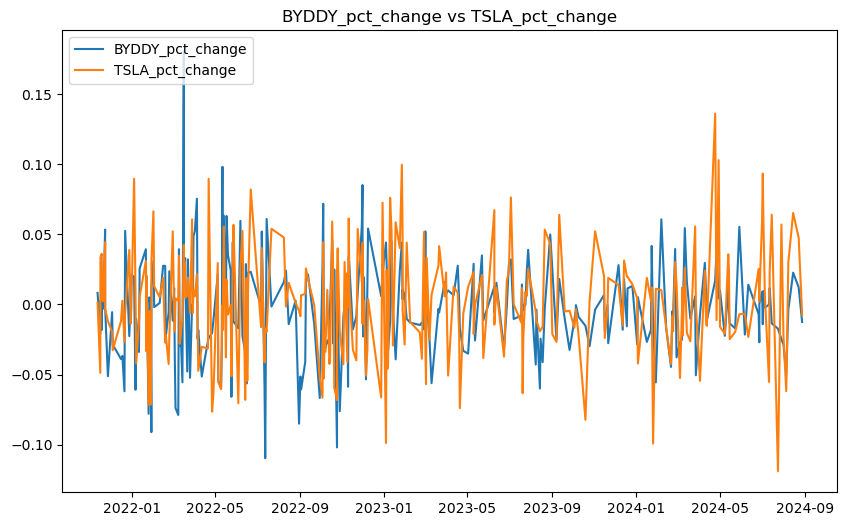

In [70]:
def plot_series(df, target, cause):
    plt.figure(figsize=(10, 6))
    plt.plot(df.index, df[target], label=target)
    plt.plot(df.index, df[cause], label=cause)
    plt.legend(loc='upper left')
    plt.title(f"{target} vs {cause}")
    plt.show()

# Example: Visualisation for BYDDY_pct_change and TSLA_pct_change
plot_series(combined_significant_changes, 'BYDDY_pct_change', 'TSLA_pct_change')

## Ljung-Box

In [71]:
# Apply the Ljung-Box test for each variable
for col in residuals.columns:
    print(f"Ljung-Box test results for {col}:")
    ljung_box_results = acorr_ljungbox(residuals[col], lags=[10], return_df=True)
    print(ljung_box_results)
    print("\n")


Ljung-Box test results for TSLA_pct_change:
     lb_stat  lb_pvalue
10  9.600009   0.476258


Ljung-Box test results for RIVN_pct_change:
      lb_stat  lb_pvalue
10  20.313967   0.026419


Ljung-Box test results for BYDDY_pct_change:
     lb_stat  lb_pvalue
10  2.085917   0.995638


Ljung-Box test results for NIO_pct_change:
      lb_stat  lb_pvalue
10  10.439954   0.402778




## ACF and PACF

In [72]:
df_ARIMA = df.copy()

# Set the Datetime as the index
#df_ARIMA.set_index('Datetime', inplace=True)

# Fill missing values using forward fill method
df_ARIMA.fillna(method='ffill', inplace=True)
df_ARIMA

,BYDDY,NIO,RIVN,TSLA
Datetime,,,,
2021-11-11 09:30:00,77.790001,41.189999,112.129997,356.909943
2021-11-11 10:30:00,78.430000,41.940701,117.940002,357.380005
2021-11-11 11:30:00,78.815002,41.674999,123.708397,355.019775
2021-11-11 12:30:00,79.080002,41.770000,120.029999,353.474213
2021-11-11 13:30:00,79.004997,41.849998,118.059998,355.734985
...,...,...,...,...
2024-08-30 11:30:00,60.689999,4.088200,13.860100,209.169907
2024-08-30 12:30:00,60.799999,4.085000,13.845000,210.477493
2024-08-30 13:30:00,60.779999,4.075000,13.970000,211.024002


In [73]:
df_ARIMA.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4906 entries, 2021-11-11 09:30:00 to 2024-08-30 15:30:00
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BYDDY   4906 non-null   float64
 1   NIO     4906 non-null   float64
 2   RIVN    4906 non-null   float64
 3   TSLA    4906 non-null   float64
dtypes: float64(4)
memory usage: 191.6 KB


In [74]:

# Select the stock columns for analysis
stocks = ['BYDDY', 'NIO', 'RIVN', 'TSLA']

# Function to plot the stock prices and ACF/PACF
def plot_stock(stock):
    clear_output(wait=True)
    fig = plt.figure(figsize=(12, 12))
    
    # Plot time series
    ax1 = fig.add_subplot(2, 1, 1)
    ax1.plot(df_ARIMA[stock])
    ax1.set_title(f'{stock} Stock Prices Over Time')
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Price')
    
    # Plot ACF and PACF side by side in the second row
    ax2 = fig.add_subplot(2, 2, 3)
    plot_acf(df_ARIMA[stock].dropna(), ax=ax2, lags=50)
    ax2.set_title(f'Autocorrelation of {stock}')
    
    ax3 = fig.add_subplot(2, 2, 4)
    plot_pacf(df_ARIMA[stock].dropna(), ax=ax3, lags=50)
    ax3.set_title(f'Partial Autocorrelation of {stock}')
    
    plt.tight_layout()
    plt.show()

# Create dropdown for stock selection and link to the function
widgets.interact(plot_stock, stock=widgets.Dropdown(options=stocks, description='Stock:'))

interactive(children=(Dropdown(description='Stock:', options=('BYDDY', 'NIO', 'RIVN', 'TSLA'), value='BYDDY'),…

<function __main__.plot_stock(stock)>

# Statistical Tests

## ANOVA

In [75]:
# Example: ANOVA test for percentage changes
anova_results = stats.f_oneway(df_change['TSLA_pct_change'], df_change['BYDDY_pct_change'],
                               df_change['NIO_pct_change'], df_change['RIVN_pct_change'])
print(anova_results)


F_onewayResult(statistic=0.42559521703157693, pvalue=0.7346549397524144)


## T-test

In [76]:
# T-test between stocks percentage changes
stocks = ['TSLA_pct_change', 'RIVN_pct_change', 'BYDDY_pct_change', 'NIO_pct_change']
for stock1 in stocks:
    for stock2 in stocks:
        if stock1 != stock2:  # In order not to compare the same stock with itself
            result = stats.ttest_ind(df_change[stock1], df_change[stock2])
            print(f'\nT-Test Result for {stock1} vs {stock2}:')
            print(f'T-Statistic: {result.statistic}, P-Value: {result.pvalue}')


T-Test Result for TSLA_pct_change vs RIVN_pct_change:
T-Statistic: 0.5968342919442713, P-Value: 0.5506317965400735

T-Test Result for TSLA_pct_change vs BYDDY_pct_change:
T-Statistic: -0.07102554359087972, P-Value: 0.9433788740790855

T-Test Result for TSLA_pct_change vs NIO_pct_change:
T-Statistic: 0.8655913677999986, P-Value: 0.3867354628278562

T-Test Result for RIVN_pct_change vs TSLA_pct_change:
T-Statistic: -0.5968342919442713, P-Value: 0.5506317965400735

T-Test Result for RIVN_pct_change vs BYDDY_pct_change:
T-Statistic: -0.691969045846151, P-Value: 0.48897314843654005

T-Test Result for RIVN_pct_change vs NIO_pct_change:
T-Statistic: 0.20213669242614168, P-Value: 0.8398140558348494

T-Test Result for BYDDY_pct_change vs TSLA_pct_change:
T-Statistic: 0.07102554359087972, P-Value: 0.9433788740790855

T-Test Result for BYDDY_pct_change vs RIVN_pct_change:
T-Statistic: 0.691969045846151, P-Value: 0.48897314843654005

T-Test Result for BYDDY_pct_change vs NIO_pct_change:
T-Statist

# Machine Learning Models

## Random Forest

### Random Forest Classifier

In [77]:
# Section 1: Data Preparation
# Take the last 25 data points
last_25_data = df_change.tail(25)
train_data = df_change.iloc[:-25]

# Features and target variables
features = ['TSLA_change']  # We are using TSLA_change as the feature to predict NIO_change
X_train_full = train_data[features]
y_train_full = train_data['RIVN_change']

# Split the remaining data into 30% test and 70% train
X_train, X_test, y_train, y_test = train_test_split(X_train_full, y_train_full, test_size=0.3, random_state=42)

In [78]:
# Section 2: Hyperparameter Tuning Using GridSearchCV
# Grid settings for hyperparameters
param_grid = {
    'n_estimators': [1,2,3,4,5,10,15,20,30],
    'max_depth': [None,1,2,3,4,5,10,20,30,40],
    'min_samples_split': [1,2,3,4,5,10,20]
}

# Using GridSearchCV to find the best Random Forest model
rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 3}


In [79]:
# Section 3: Model Evaluation on Test Data
# Predicting with the test data
y_pred = best_model.predict(X_test)

# Evaluate the model performance (accuracy and classification report)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Model Accuracy Rate: {accuracy}")
print(f"Classification Report:\n{report}")

Model Accuracy Rate: 0.9610655737704918
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1423
           1       0.23      0.17      0.20        41

    accuracy                           0.96      1464
   macro avg       0.60      0.58      0.59      1464
weighted avg       0.96      0.96      0.96      1464



In [80]:
# Section 4: Prediction for the Last 25 Data Points
# Make a prediction for the last 25 data points
X_last_25_data = last_25_data[features]
y_last_25_data = last_25_data['NIO_change']
y_pred_last_25_data = best_model.predict(X_last_25_data)

# Comparison of actual and predicted values for the last 25 data points
comparison_df = pd.DataFrame({
    'Actual Values': y_last_25_data.values,
    'Predicted Values': y_pred_last_25_data
})
#print("Comparison of Actual and Predicted Values for the Last 25 Data Points:\n", comparison_df)

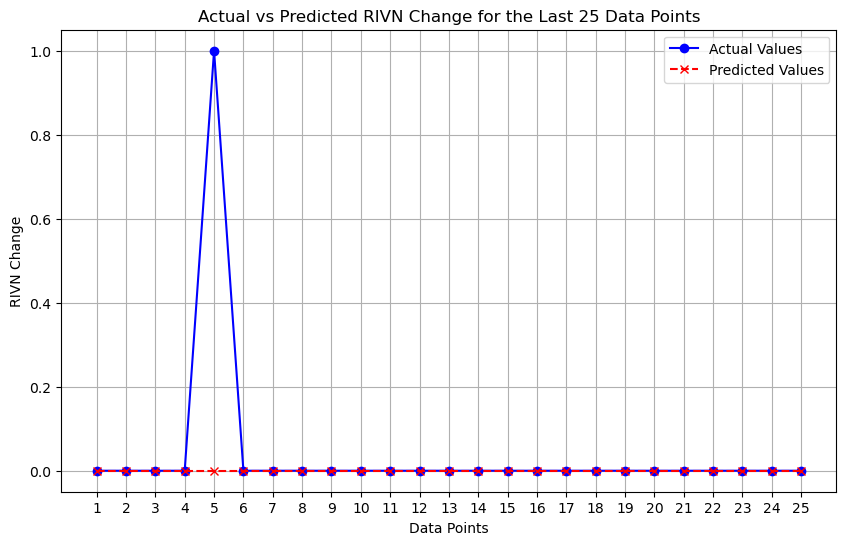

In [81]:
# Section 5: Comparison Graph of Actual and Predicted Values for the Last 25 Data Points
plt.figure(figsize=(10, 6))
plt.plot(range(1, 26), y_last_25_data.values, marker='o', label='Actual Values', linestyle='-', color='blue')
plt.plot(range(1, 26), y_pred_last_25_data, marker='x', label='Predicted Values', linestyle='--', color='red')

plt.title('Actual vs Predicted RIVN Change for the Last 25 Data Points')
plt.xlabel('Data Points')
plt.ylabel('RIVN Change')
plt.xticks(range(1, 26))
plt.legend()
plt.grid(True)
plt.show()


### Random Forest Regressor

In [82]:
# Section 1: Data Preparation
# Take the last 3 data points
last_3_data = df_change.tail(3)
train_data = df_change.iloc[:-3]

# Features and target variables
features = ['TSLA_pct_change','BYDDY_pct_change','NIO_pct_change']
X_train_full = train_data[features]
y_train_full = train_data['RIVN_pct_change']

# Last 3 data points' features and target variable
X_last_3_data = last_3_data[features]
y_last_3_data = last_3_data['RIVN_pct_change']

# Normalize the data (scaling)
scaler = StandardScaler()
X_train_full = scaler.fit_transform(X_train_full)
#_last_3_data = scaler.transform(X_last_3_data)

# Split the remaining data into 30% test and 70% train
X_train, X_test, y_train, y_test = train_test_split(X_train_full, y_train_full, test_size=0.3, random_state=40)

In [83]:
# Section 2: Hyperparameter Tuning Using GridSearchCV
# Grid settings for hyperparameters
param_grid = {
    'max_depth': [None,1,5,10,15,20,25],
    'min_samples_split': [2,10,20,25,30,35],
    'n_estimators': [10,50,70,100,120,130,150]
}

# Using GridSearchCV to find the best Random Forest model
rf_model = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best parameters
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

# Best model from GridSearch
best_model_pct = grid_search.best_estimator_

Best Parameters: {'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 150}


In [84]:
# Section 3: Model Evaluation on Test Data
# Predicting with the test data
y_pred = best_model_pct.predict(X_test)

# Evaluating the model performance (R² score and Error Metrics)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Model R² Score: {r2}")
print(f"Mean Square Error (MSE): {mse}")

Model R² Score: 0.285053932569139
Mean Square Error (MSE): 0.00033567895485969495


Iterative Forecasting: After the model makes a forecast for the first data point, we put that point back into the predicted data set with its actual value. Thus, each forecast is made with updated data relative to the previous forecast. Adding New Rows: Each predicted data is added to the training dataset with its true value so that the model can use that data to make the next prediction better. Retraining the Model (Optional): The model is retrained after each prediction. This can be particularly useful for time series data

In [85]:
# Section 4: Prediction for the Last 3 Data Points
# List to store predictions and actual values for comparison
predictions = []

# Copy y_train_full to keep it updated during iterative training
y_train_full_updated = y_train_full.copy()

# Iteratively predict for each of the last 3 data points
for i in range(3):
    # Scale the current feature set (for ith data point)
    X_current = scaler.transform(X_last_3_data.iloc[[i]])

    # Predict the value using the best model
    y_pred_current = best_model_pct.predict(X_current)

    # Store actual and predicted values
    actual_value = y_last_3_data.iloc[i]
    predictions.append({
        'Actual Value': actual_value,
        'Predicted Value': y_pred_current[0]
    })

    # Prepare the new row to simulate adding it to the training set
    new_row = pd.DataFrame({
        'TSLA_pct_change': [last_3_data['TSLA_pct_change'].iloc[i]],
        'BYDDY_pct_change': [last_3_data['BYDDY_pct_change'].iloc[i]],
        'RIVN_pct_change': [last_3_data['RIVN_pct_change'].iloc[i]],
        'NIO_pct_change': [y_last_3_data.iloc[i]]
    })

    # Scale the features of the new row using the already-fitted scaler
    new_row_scaled = scaler.transform(new_row[features])

    # Append the scaled new row to the training data (without modifying df_change)
    X_train_full = np.vstack([X_train_full, new_row_scaled])

    # Append the actual value of NIO_pct_change to the target variable
    y_train_full_updated = np.append(y_train_full_updated, y_last_3_data.iloc[i])
    
    
    # Print added row to ensure it's not a duplicate
    #print(f"Predicted Value {i}: {y_pred_current}")
    print(f"Added new row for iteration {i}: {new_row_scaled}")

    # Refit the model after adding each actual data point (optional step)
    best_model_pct.fit(X_train_full, y_train_full_updated)

# Convert the results to a DataFrame for better visualization
comparison_df = pd.DataFrame(predictions)

# Calculate the percentage error for each data point
comparison_df['Percentage Error'] = abs((comparison_df['Actual Value'] - comparison_df['Predicted Value'])
                                        / comparison_df['Actual Value']) * 100

print("\nComparison of Actual and Predicted Values for the Last 3 Data Points with Iterative Approach:\n", comparison_df)

Added new row for iteration 0: [[ 0.19068927 -0.03147569  0.49715273]]
Added new row for iteration 1: [[0.4447767  0.10747925 0.1684243 ]]
Added new row for iteration 2: [[0.62168981 0.16904744 0.47245364]]

Comparison of Actual and Predicted Values for the Last 3 Data Points with Iterative Approach:
    Actual Value  Predicted Value  Percentage Error
0      0.009029         0.001377         84.744296
1      0.002863         0.004251         48.479114
2      0.008565         0.002267         73.535272


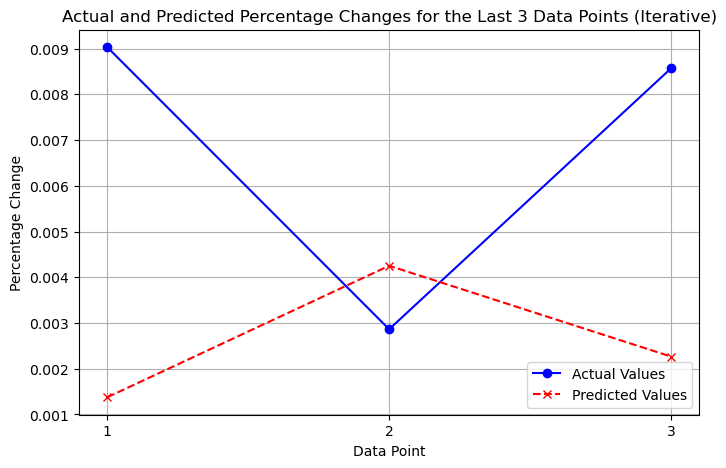

In [86]:
# Section 5: Comparison Graph of Actual and Predicted Values for the Last 3 Data Points
plt.figure(figsize=(8, 5))
plt.plot(range(1, 4), comparison_df['Actual Value'], marker='o', label='Actual Values', linestyle='-', color='blue')
plt.plot(range(1, 4), comparison_df['Predicted Value'], marker='x', label='Predicted Values', linestyle='--', color='red')

plt.title('Actual and Predicted Percentage Changes for the Last 3 Data Points (Iterative)')
plt.xlabel('Data Point')
plt.ylabel('Percentage Change')
plt.xticks(range(1, 4))
plt.legend()
plt.grid(True)
plt.show()

## Sarima

In [87]:
# Set the Datetime as the index
rivn_data = df_change['RIVN_pct_change']

# Split the data: train data (all but the last 3 points) and test data (last 3 points)
train_data = rivn_data[:-3]
test_data = rivn_data[-3:]

# Fit the SARIMA model on the training data
sarima_model = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit(disp=False)

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



In [88]:
# Forecast the next 3 points (matching the length of the test data)
forecast = sarima_result.get_forecast(steps=3)
forecast_mean = forecast.predicted_mean

# Calculate the error between the forecasted and actual values
comparison_df = pd.DataFrame({
    'Actual Values': test_data.values,
    'Predicted Values': forecast_mean.values
})

# Calculate percentage error for each prediction
comparison_df['Percentage Error'] = abs((comparison_df['Actual Values'] - comparison_df['Predicted Values'])
                                        / comparison_df['Actual Values']) * 100

# Display the comparison table
print("Comparison of Actual and Predicted Values for the Last 3 Data Points:\n", comparison_df)

Comparison of Actual and Predicted Values for the Last 3 Data Points:
    Actual Values  Predicted Values  Percentage Error
0       0.009029         -0.000394        104.364023
1       0.002863         -0.000301        110.516120
2       0.008565          0.001087         87.308220


C:\Users\TUNAHAN\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [89]:
#Calculate MAE, MSE, RMSE, and R-squared
mae = mean_absolute_error(test_data, forecast_mean)
mse = mean_squared_error(test_data, forecast_mean)
rmse = np.sqrt(mse)
r2 = r2_score(test_data, forecast_mean)

# Display performance metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²) Score: {r2}")
print("Comparison of Actual and Predicted Values for the Last 3 Data Points:\n", comparison_df)

Mean Absolute Error (MAE): 0.00668837704910671
Mean Squared Error (MSE): 5.157372710057042e-05
Root Mean Squared Error (RMSE): 0.007181485020562977
R-squared (R²) Score: -5.561724034300395
Comparison of Actual and Predicted Values for the Last 3 Data Points:
    Actual Values  Predicted Values  Percentage Error
0       0.009029         -0.000394        104.364023
1       0.002863         -0.000301        110.516120
2       0.008565          0.001087         87.308220


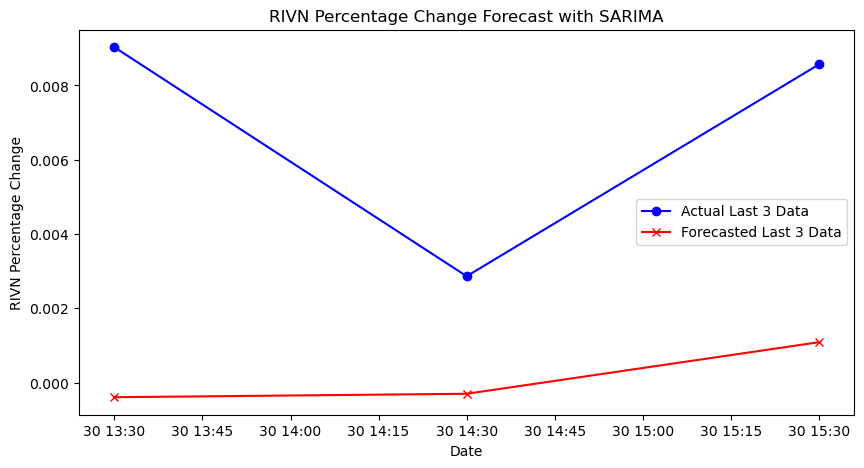

In [90]:
# Plot the results
plt.figure(figsize=(10, 5))
# Plot the actual data (last 20 points) and forecasted values
plt.plot(test_data.index, test_data.values, label='Actual Last 3 Data', color='blue', marker='o')
plt.plot(test_data.index, forecast_mean, label='Forecasted Last 3 Data', color='red', marker='x')
plt.legend()
plt.title('RIVN Percentage Change Forecast with SARIMA')
plt.xlabel('Date')
plt.ylabel('RIVN Percentage Change')
plt.show()